# Improved ATF analysis for astrocyte current-clamp traces

This notebook is a sectioned conversion of the attached Python script.

## Main changes relative to the original notebook
1. Artifact correction is explicit and conservative; global smoothing is no longer forced during preprocessing.
2. Long transient artifacts are detected automatically instead of relying on hard-coded file-specific windows. Optional manual windows are still supported via `MANUAL_TRANSIENT_ARTIFACT_HINTS`.**VH6_MFA_Ba(sw3,32-35),VH6_MFA(sw1,35-41.5), DH5_MFA(sw5,22-27)**
3. Plateau handling is plateau-aware: end-of-step level is kept separate from true plateau level.
4. Rise kinetics are referenced to a sustained response target (`plateau` if present, otherwise end-of-stimulus level), not always to peak.***** change to depolaristion amp***
5. Post-stimulus undershoot is searched over the full available post-step recording, with censoring flags when the nadir is likely incomplete.

Run the cells from top to bottom.


In [1]:
from pathlib import Path
from copy import deepcopy
import csv
import json
import re
import shutil
from collections import OrderedDict, defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter


## Configuration

Set the data source, output folder name, optional manual artifact windows, and the requested output features.


In [2]:
# ---------- data location ----------
# Choose one of:
#   "auto"                -> first look for local .atf files, otherwise use the Google Drive folder URL below
#   "local"               -> use LOCAL_DATA_DIR
#   "mounted_drive_folder"-> mount Google Drive and read files directly from MOUNTED_DRIVE_FOLDER
#   "google_drive_folder" -> authenticate to Google Drive and download all .atf files from GOOGLE_DRIVE_FOLDER_URL
DATA_SOURCE = "google_drive_folder"

LOCAL_DATA_DIR = None
MOUNTED_DRIVE_FOLDER = None
GOOGLE_DRIVE_FOLDER_URL = "https://drive.google.com/drive/u/0/folders/1SEXPBkyA1DHLa2XNQJIRh-gJnPBVksKd"
GOOGLE_DRIVE_DOWNLOAD_DIR = "/content/atf_from_google_drive"

OUTPUT_SUBDIR = "astro_feature_outputs_improved"

# Optional manual artifact windows:
# {
#   "FILE_NAME.atf": {
#       3: {"windows_s": [(31.8, 32.5)]},
#       5: {"windows_s": [(17.9, 18.4), (19.2, 19.5)]},
#   }
# }
#
# Leave empty by default. The automatic transient detector handles the sample
# data provided here without file-specific hard-coding.
MANUAL_TRANSIENT_ARTIFACT_HINTS = {"DH_6_MFA_Ba.atf": {
        5: {"windows_s": [(0.0, 10.0)], "ipatch_abs_thr_mV": 0.8},
    },
    "VH_5_MFA_Ba.atf": {
        2: {"windows_s": [(3.0, 8.0)], "ipatch_abs_thr_mV": 0.8},
    },
    "VH_6_MFA.atf": {
        1: {"windows_s": [(35.0, 40.0)], "ipatch_abs_thr_mV": 0.6},
    },
    "VH_6_MFA_Ba.atf": {
        3: {"windows_s": [(32.0, 35.0)], "ipatch_abs_thr_mV": 0.8}
    },}

REQUESTED_FEATURES = [
    "peak_depolarization_mV",
    "rise_slope_mV_per_s",
    "rise_tau_s",
    "plateau_slope_mV_per_s",
    "decay_slope_mV_per_s",
    "decay_tau_s",
    "undershoot_magnitude_mV",
    "return_slope_mV_per_s",
]


## Data discovery and ATF parsing

These functions locate `.atf` files, parse ATF headers/data, build the sweep map, and infer experimental factors from filenames.


In [3]:
def running_in_colab():
    try:
        import google.colab  # noqa: F401
        return True
    except Exception:
        return False


def extract_drive_folder_id(folder_url_or_id):
    if folder_url_or_id is None:
        return None

    text = str(folder_url_or_id).strip()
    if not text:
        return None

    m = re.search(r"/folders/([a-zA-Z0-9_-]+)", text)
    if m:
        return m.group(1)

    m = re.search(r"[?&]id=([a-zA-Z0-9_-]+)", text)
    if m:
        return m.group(1)

    if re.fullmatch(r"[a-zA-Z0-9_-]{10,}", text):
        return text

    raise ValueError(f"Could not extract a Google Drive folder ID from: {folder_url_or_id}")


def infer_local_data_dir():
    for candidate in [Path("/mnt/data"), Path("/content"), Path(".")]:
        if candidate.exists() and any(p.is_file() and p.suffix.lower() == ".atf" for p in candidate.rglob("*")):
            return candidate
    return Path("/content") if Path("/content").exists() else Path(".")


def ensure_pydrive2():
    try:
        from pydrive2.auth import GoogleAuth  # noqa: F401
        from pydrive2.drive import GoogleDrive  # noqa: F401
    except Exception:
        import subprocess
        import sys
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "PyDrive2"])


def build_google_drive_client():
    if not running_in_colab():
        raise EnvironmentError("Google Drive authentication helper is intended for Google Colab.")

    ensure_pydrive2()

    from google.colab import auth
    from oauth2client.client import GoogleCredentials
    from pydrive2.auth import GoogleAuth
    from pydrive2.drive import GoogleDrive

    auth.authenticate_user()
    gauth = GoogleAuth()
    gauth.credentials = GoogleCredentials.get_application_default()
    return GoogleDrive(gauth)


def download_google_drive_folder(folder_url_or_id, target_dir, allowed_suffixes=(".atf",)):
    folder_id = extract_drive_folder_id(folder_url_or_id)
    if folder_id is None:
        raise ValueError("A Google Drive folder URL or folder ID is required.")

    drive_client = build_google_drive_client()
    target_dir = Path(target_dir)
    target_dir.mkdir(parents=True, exist_ok=True)

    downloaded = []
    visited_folders = set()

    def recurse(folder_id, local_dir):
        if folder_id in visited_folders:
            return
        visited_folders.add(folder_id)

        query = f"'{folder_id}' in parents and trashed=false"
        items = drive_client.ListFile({"q": query}).GetList()

        for item in items:
            title = item["title"]
            mime_type = item["mimeType"]

            if mime_type == "application/vnd.google-apps.folder":
                subdir = local_dir / title
                subdir.mkdir(parents=True, exist_ok=True)
                recurse(item["id"], subdir)
                continue

            if Path(title).suffix.lower() not in {s.lower() for s in allowed_suffixes}:
                continue

            destination = local_dir / title
            print(f"Downloading {title} -> {destination}")
            item.GetContentFile(str(destination))
            downloaded.append(destination)

    recurse(folder_id, target_dir)
    return sorted(downloaded)


def mount_google_drive_folder(folder_path):
    if not running_in_colab():
        raise EnvironmentError("Google Drive mounting is intended for Google Colab.")

    from google.colab import drive
    drive.mount("/content/drive", force_remount=False)

    folder = Path(folder_path)
    if not folder.exists():
        raise FileNotFoundError(f"Mounted Google Drive folder not found: {folder}")
    return folder


def resolve_data_dir():
    if DATA_SOURCE == "local":
        return Path(LOCAL_DATA_DIR) if LOCAL_DATA_DIR else infer_local_data_dir()

    if DATA_SOURCE == "mounted_drive_folder":
        if not MOUNTED_DRIVE_FOLDER:
            raise ValueError("Set MOUNTED_DRIVE_FOLDER when DATA_SOURCE='mounted_drive_folder'.")
        return mount_google_drive_folder(MOUNTED_DRIVE_FOLDER)

    if DATA_SOURCE == "google_drive_folder":
        data_dir = Path(GOOGLE_DRIVE_DOWNLOAD_DIR)
        downloaded_files = download_google_drive_folder(GOOGLE_DRIVE_FOLDER_URL, data_dir)
        if not downloaded_files:
            raise FileNotFoundError(f"No .atf files were found in Google Drive folder: {GOOGLE_DRIVE_FOLDER_URL}")
        print(f"Downloaded {len(downloaded_files)} .atf files from Google Drive.")
        return data_dir

    # auto
    local_dir = infer_local_data_dir()
    local_files = [p for p in local_dir.rglob("*") if p.is_file() and p.suffix.lower() == ".atf"]
    if local_files:
        print(f"Found {len(local_files)} local .atf files in {local_dir}.")
        return local_dir

    if GOOGLE_DRIVE_FOLDER_URL:
        data_dir = Path(GOOGLE_DRIVE_DOWNLOAD_DIR)
        downloaded_files = download_google_drive_folder(GOOGLE_DRIVE_FOLDER_URL, data_dir)
        if downloaded_files:
            print(f"Downloaded {len(downloaded_files)} .atf files from Google Drive.")
            return data_dir

    raise FileNotFoundError("No .atf files were found locally or in the configured Google Drive folder.")


DATA_DIR = resolve_data_dir()
OUTPUT_DIR = DATA_DIR / "astro_feature_outputs_expanded"
RAW_INSPECTION_DIR = OUTPUT_DIR / "raw_inspection"
PREPROC_REVIEW_DIR = OUTPUT_DIR / "preprocessing_review"

for folder in [OUTPUT_DIR, RAW_INSPECTION_DIR, PREPROC_REVIEW_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

print("Using data folder:", DATA_DIR)
print("Output folder:", OUTPUT_DIR)

# ---------- ATF parsing helpers ----------


def make_unique(names):
    counts={}
    out=[]
    for name in names:
        if name not in counts:
            counts[name]=0
            out.append(name)
        else:
            counts[name]+=1
            out.append(f"{name}__{counts[name]}")
    return out


def discover_atf_files(folder: Path):
    return sorted(folder.glob("*.atf"))


def parse_atf(path: Path):
    with open(path, "r", errors="replace", newline="") as f:
        version = f.readline().rstrip("\n\r")
        n_header_lines, declared_n_cols = map(int, f.readline().rstrip("\n\r").split("\t"))
        header_lines = [f.readline().rstrip("\n\r") for _ in range(n_header_lines)]
        columns_line = f.readline().rstrip("\n\r")
        columns = next(csv.reader([columns_line], delimiter="\t", quotechar='"'))
        unique_columns = make_unique(columns)
        data = pd.read_csv(f, sep="\t", header=None, names=unique_columns)
    meta = OrderedDict()
    for line in header_lines:
        row = next(csv.reader([line], delimiter="\t", quotechar='"'))
        if not row:
            continue
        if len(row) == 1:
            m = re.match(r"([^=]+)=(.*)", row[0])
            if m:
                meta[m.group(1)] = m.group(2)
            else:
                meta[row[0]] = None
        else:
            key = row[0]
            if key.endswith("="):
                key = key[:-1]
            meta[key] = row[1:]
    return {"path": path, "version": version, "n_header_lines": n_header_lines, "declared_n_cols": declared_n_cols, "meta": meta, "columns": columns, "unique_columns": unique_columns, "data": data}

def get_sweep_map(parsed):
    data_cols = [c for c in parsed["unique_columns"] if c != "Time (s)"]
    signals = parsed["meta"].get("Signals", [])
    if isinstance(signals, str):
        signals = [s for s in signals.split(",") if s]
    sweep_map = defaultdict(dict)
    if len(signals) == len(data_cols):
        for col_name, signal_name in zip(data_cols, signals):
            m = re.search(r"Trace #(\d+)", col_name)
            sweep_num = int(m.group(1)) if m else len(sweep_map) + 1
            sweep_map[sweep_num][signal_name] = col_name
    else:
        for i, col_name in enumerate(data_cols, start=1):
            m = re.search(r"Trace #(\d+)", col_name)
            sweep_num = int(m.group(1)) if m else i
            sweep_map[sweep_num]["signal"] = col_name
    return {k: sweep_map[k] for k in sorted(sweep_map)}


def parse_experimental_factors(file_name: str):
    stem = Path(file_name).stem
    upper = stem.upper()
    if "MFA_BA" in upper or "MFA-BA" in upper:
        condition = "MFA_BA"
    elif "MFA" in upper:
        condition = "MFA"
    else:
        condition = "control"
    region = None
    if upper.startswith("VH_") or "_VH_" in upper or upper == "VH":
        region = "VH"
    elif upper.startswith("DH_") or "_DH_" in upper or upper == "DH":
        region = "DH"
    elif re.match(r"^T\d", upper):
        region = "DH"
    if region is None:
        region = "unknown"
    cell_label = re.sub(r"(?i)_MFA_BA|_MFA-BA|_MFA", "", stem)
    cell_label = re.sub(r"__+", "_", cell_label).strip("_")
    return {
        "file": file_name,
        "stem": stem,
        "region": region,
        "condition": condition,
        "group_label": f"{region}_{condition}",
        "cell_label": cell_label,
    }


Downloaded 37 .atf files from Google Drive.
Using data folder: /content/atf_from_google_drive
Output folder: /content/atf_from_google_drive/astro_feature_outputs_expanded


## Signal utilities and stimulus edge detection

This section provides moving-average helpers, step-edge detection, and interval utilities used later in preprocessing.


In [4]:
def moving_average(x, window_pts):
    x=np.asarray(x,dtype=float)
    n=max(3,int(window_pts))
    if n%2==0:
        n+=1
    return np.convolve(x, np.ones(n)/n, mode='same')


def average_signal(data, sweep_map, signal_name):
    cols = [cols[signal_name] for cols in sweep_map.values() if signal_name in cols]
    if not cols:
        return None
    return data[cols].mean(axis=1).to_numpy()


def detect_step_edges(t, x, response_only=False):
    t=np.asarray(t,dtype=float)
    x=np.asarray(x,dtype=float)
    dt=float(np.median(np.diff(t)))
    x_smooth=moving_average(x, max(5, int(round(0.05/dt))))
    dx=np.diff(x_smooth)
    duration=float(t[-1]-t[0])
    if response_only:
        onset_mask=(t[1:]>=t[0]+0.10*duration)&(t[1:]<=t[0]+0.60*duration)
    else:
        onset_mask=(t[1:]>=t[0]+0.02*duration)&(t[1:]<=t[0]+0.70*duration)
    onset_candidates=np.where(onset_mask)[0]
    onset_idx = onset_candidates[np.argmax(dx[onset_mask])] if len(onset_candidates) else int(np.argmax(dx))
    min_gap = max(2.0, 0.05*duration)
    offset_mask = (t[1:]>=t[onset_idx+1]+min_gap)&(t[1:]<=t[-1]-min_gap)
    offset_candidates=np.where(offset_mask)[0]
    if len(offset_candidates):
        offset_idx=offset_candidates[np.argmin(dx[offset_mask])]
    else:
        rel=int(np.argmin(dx[onset_idx+1:]))
        offset_idx=onset_idx+1+rel
    return float(t[onset_idx+1]), float(t[offset_idx+1])


def pick_step_source(parsed, sweep_map):
    data=parsed["data"]; t=data["Time (s)"].to_numpy()
    for sig,response_only in [("IP_curr",False),("IP_volt",False),("Ipatch_R",True)]:
        x=average_signal(data,sweep_map,sig)
        if x is not None:
            onset_s, offset_s=detect_step_edges(t,x,response_only=response_only)
            return sig,onset_s,offset_s
    first_sweep=next(iter(sweep_map.values()))
    first_signal_name=next(iter(first_sweep.keys()))
    x=average_signal(data,sweep_map,first_signal_name)
    onset_s, offset_s=detect_step_edges(t,x,response_only=True)
    return first_signal_name, onset_s, offset_s

def merge_intervals(intervals, gap=0):
    if not intervals:
        return []
    intervals = sorted(intervals)
    merged = [list(intervals[0])]
    for a,b in intervals[1:]:
        if a <= merged[-1][1] + gap:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a,b])
    return [(a,b) for a,b in merged]


def intervals_to_mask(n, intervals):
    mask = np.zeros(int(n), dtype=bool)
    for a,b in intervals:
        a=max(0,int(a)); b=min(int(n)-1, int(b))
        if a<=b: mask[a:b+1]=True
    return mask


def time_intervals_to_index_intervals(t, intervals_s, pad_s=0.0):
    t=np.asarray(t,dtype=float)
    out=[]
    for a_s,b_s in intervals_s:
        a_s=max(float(t[0]), float(a_s)-float(pad_s))
        b_s=min(float(t[-1]), float(b_s)+float(pad_s))
        a=max(0,int(np.searchsorted(t,a_s,side='left')))
        b=min(len(t)-1,int(np.searchsorted(t,b_s,side='right'))-1)
        if a<=b: out.append((a,b))
    return merge_intervals(out, gap=1)


## Artifact correction and preprocessing

These functions identify brief jumps, isolated outliers, and longer transient artifacts, then interpolate over flagged intervals and assemble preprocessing QC.


In [5]:
def correct_brief_jump_artifacts(v, diff_nmad=12.0, abs_jump_mV=0.5, max_artifact_pts=8, pad_pts=1):
    v=np.asarray(v,dtype=float)
    dv=np.diff(v)
    robust_sigma = 1.4826 * np.median(np.abs(dv - np.median(dv)))
    jump_thr = max(abs_jump_mV, diff_nmad * robust_sigma)
    jump_idx = np.where(np.abs(dv) > jump_thr)[0]
    candidate_intervals = [(max(0, i-pad_pts), min(len(v)-1, i+1+pad_pts)) for i in jump_idx]
    candidate_intervals = merge_intervals(candidate_intervals, gap=1)
    out=v.copy()
    corrected_mask=np.zeros(len(v), dtype=bool)
    corrected_segments=[]
    for a,b in candidate_intervals:
        seg_len=b-a+1
        if seg_len > max_artifact_pts or a==0 or b>=len(v)-1:
            continue
        left=a-1; right=b+1
        interp=np.interp(np.arange(a,b+1), [left,right], [out[left], out[right]])
        max_dev=float(np.max(np.abs(out[a:b+1]-interp)))
        if max_dev >= abs_jump_mV:
            out[a:b+1]=interp
            corrected_mask[a:b+1]=True
            corrected_segments.append((a,b,max_dev))
    return out, corrected_mask, jump_thr, corrected_segments


def correct_isolated_outliers(v, abs_threshold_mV=1.5, nmad=12.0, max_run_pts=4):
    v=np.asarray(v,dtype=float)
    err=np.zeros_like(v)
    err[1:-1]=v[1:-1]-0.5*(v[:-2]+v[2:])
    robust_sigma = 1.4826*np.median(np.abs(err[1:-1]-np.median(err[1:-1])))
    thr = max(abs_threshold_mV, nmad * robust_sigma)
    cand=np.zeros(len(v), dtype=bool)
    cand[1:-1]=np.abs(err[1:-1]) > thr
    out=v.copy()
    corrected_mask=np.zeros(len(v), dtype=bool)
    runs = merge_intervals([(i,i) for i in np.where(cand)[0]], gap=1)
    for a,b in runs:
        run_len=b-a+1
        if run_len > max_run_pts or a==0 or b>=len(v)-1:
            continue
        interp=np.interp(np.arange(a,b+1), [a-1,b+1], [out[a-1], out[b+1]])
        max_dev=float(np.max(np.abs(out[a:b+1]-interp)))
        if max_dev >= abs_threshold_mV:
            out[a:b+1]=interp
            corrected_mask[a:b+1]=True
    return out, corrected_mask, thr


def auto_transient_artifact_intervals(
    t,
    v_ipatch,
    onset_s=None,
    offset_s=None,
    v_aux=None,
    short_s=0.015,
    ref_s=0.75,
    abs_thr_mV=0.8,
    nmad=8.0,
    aux_ref_s=0.4,
    aux_abs_thr=1.0,
    aux_nmad=8.0,
    exclude_boundary_s=0.5,
    onset_guard_s=1.5,
    edge_guard_s=0.5,
    offset_guard_s=0.7,
    merge_gap_s=0.05,
    expand_s=0.05,
    max_window_s=1.2,
    min_window_s=0.02,
):
    t=np.asarray(t,dtype=float); v=np.asarray(v_ipatch,dtype=float)
    dt=float(np.median(np.diff(t))); n=len(t)
    valid=np.ones(n,dtype=bool)
    valid &= (t >= t[0]+exclude_boundary_s) & (t <= t[-1]-exclude_boundary_s)
    if onset_s is not None:
        valid &= ~((t >= onset_s-edge_guard_s) & (t <= onset_s+onset_guard_s))
    if offset_s is not None:
        valid &= ~((t >= offset_s-edge_guard_s) & (t <= offset_s+offset_guard_s))
    x = moving_average(v, max(5,int(round(short_s/dt))))
    ref = moving_average(x, max(11,int(round(ref_s/dt))))
    resid = x - ref
    sigma = 1.4826*np.median(np.abs(resid[valid]-np.median(resid[valid]))) if valid.any() else 0.0
    thr=max(abs_thr_mV, nmad*sigma)
    cand = valid & (np.abs(resid) >= thr)
    if v_aux is not None:
        xa = moving_average(np.asarray(v_aux,dtype=float), max(5,int(round(short_s/dt))))
        refa = moving_average(xa, max(11,int(round(aux_ref_s/dt))))
        resida = xa - refa
        sigmaa = 1.4826*np.median(np.abs(resida[valid]-np.median(resida[valid]))) if valid.any() else 0.0
        thra = max(aux_abs_thr, aux_nmad*sigmaa)
        cand |= valid & (np.abs(resida) >= thra)
    gap_pts=max(1,int(round(merge_gap_s/dt)))
    expand_pts=int(round(expand_s/dt))
    max_pts=max(2,int(round(max_window_s/dt)))
    min_pts=max(1,int(round(min_window_s/dt)))
    runs=merge_intervals([(i,i) for i in np.where(cand)[0]], gap=gap_pts)
    refined=[]
    for a,b in runs:
        a=max(0,a-expand_pts); b=min(n-1,b+expand_pts)
        seg_len = b-a+1
        if seg_len <= max_pts and seg_len >= min_pts:
            refined.append((a,b))
    return merge_intervals(refined, gap=gap_pts)


def interpolate_over_intervals(v, intervals, dt, anchor_window_s=0.03):
    v=np.asarray(v,dtype=float)
    out=v.copy(); repaired_mask=np.zeros(len(v),dtype=bool)
    anchor_pts=max(3,int(round(anchor_window_s/dt)))
    for a,b in intervals:
        if a<=0 or b>=len(v)-1: continue
        left0=max(0,a-anchor_pts); left1=a
        right0=b+1; right1=min(len(v), b+1+anchor_pts)
        if left1-left0 < 1 or right1-right0 < 1: continue
        y_left=float(np.median(out[left0:left1])); y_right=float(np.median(out[right0:right1]))
        out[a:b+1]=np.interp(np.arange(a,b+1), [a-1,b+1], [y_left, y_right])
        repaired_mask[a:b+1]=True
    return out, repaired_mask


def preprocess_ipatch_trace(v, t, dt, onset_s=None, offset_s=None, ipvolt=None, artifact_hint_config=None, apply_sg=False, sg_window_s=0.011, polyorder=2):
    v=np.asarray(v,dtype=float)
    artifact_hint_config=artifact_hint_config or {}
    jump_corrected, jump_mask, jump_thr, jump_segments = correct_brief_jump_artifacts(
        v, diff_nmad=12.0, abs_jump_mV=2.0, max_artifact_pts=max(3,int(round(0.008/dt))), pad_pts=1
    )
    despiked, iso_mask, iso_thr = correct_isolated_outliers(
        jump_corrected, abs_threshold_mV=1.5, nmad=12.0, max_run_pts=max(1,int(round(0.002/dt)))
    )
    repaired = despiked.copy()
    auto_intervals_idx = auto_transient_artifact_intervals(
        t=t, v_ipatch=despiked, onset_s=onset_s, offset_s=offset_s, v_aux=ipvolt,
        short_s=artifact_hint_config.get('auto_short_s',0.015),
        ref_s=artifact_hint_config.get('auto_ref_s',0.75),
        abs_thr_mV=artifact_hint_config.get('auto_abs_thr_mV',0.8),
        nmad=artifact_hint_config.get('auto_nmad',8.0),
        aux_ref_s=artifact_hint_config.get('auto_aux_ref_s',0.4),
        aux_abs_thr=artifact_hint_config.get('auto_aux_abs_thr',1.0),
        aux_nmad=artifact_hint_config.get('auto_aux_nmad',8.0),
        exclude_boundary_s=artifact_hint_config.get('auto_exclude_boundary_s',0.5),
        onset_guard_s=artifact_hint_config.get('auto_onset_guard_s',1.5),
        edge_guard_s=artifact_hint_config.get('auto_edge_guard_s',0.5),
        offset_guard_s=artifact_hint_config.get('auto_offset_guard_s',0.7),
        merge_gap_s=artifact_hint_config.get('auto_merge_gap_s',0.05),
        expand_s=artifact_hint_config.get('auto_expand_s',0.05),
        max_window_s=artifact_hint_config.get('auto_max_window_s',5.0),
        min_window_s=artifact_hint_config.get('auto_min_window_s',0.02),
    )
    repaired, auto_mask = interpolate_over_intervals(repaired, auto_intervals_idx, dt, anchor_window_s=artifact_hint_config.get('anchor_window_s',0.03))
    manual_intervals_s = artifact_hint_config.get('windows_s', [])
    manual_idx = time_intervals_to_index_intervals(t, manual_intervals_s, pad_s=artifact_hint_config.get('manual_pad_s', 0.0))
    if manual_idx:
        repaired, manual_mask = interpolate_over_intervals(repaired, manual_idx, dt, anchor_window_s=artifact_hint_config.get('anchor_window_s',0.03))
    else:
        manual_mask = np.zeros(len(v),dtype=bool)
    corrected_mask = jump_mask | iso_mask | auto_mask | manual_mask
    if apply_sg:
        win=max(5,int(round(sg_window_s/dt)))
        if win%2==0: win+=1
        if win<=polyorder:
            win = polyorder+3 if (polyorder+3)%2==1 else polyorder+4
        out=savgol_filter(repaired, window_length=win, polyorder=polyorder, mode='interp')
    else:
        out=repaired
        win=None
    qc={
        'n_corrected_points': int(corrected_mask.sum()),
        'fraction_corrected': float(corrected_mask.mean()),
        'jump_threshold_mV': float(jump_thr),
        'isolated_threshold_mV': float(iso_thr),
        'apply_preprocess_sg': bool(apply_sg),
        'sg_window_pts': int(win) if win is not None else np.nan,
        'sg_window_ms': float(win * dt * 1000.0) if win is not None else np.nan,
        'polyorder': int(polyorder) if apply_sg else np.nan,
        'n_jump_segments': int(len(jump_segments)),
        'n_auto_intervals': int(len(auto_intervals_idx)),
        'n_auto_repaired_points': int(auto_mask.sum()),
        'n_manual_intervals': int(len(manual_idx)),
        'n_manual_repaired_points': int(manual_mask.sum()),
    }
    all_intervals_idx = merge_intervals(auto_intervals_idx + manual_idx, gap=1)
    return out, corrected_mask, qc, all_intervals_idx, {'jump': jump_mask, 'isolated': iso_mask, 'auto': auto_mask, 'manual': manual_mask}


def preprocess_parsed(parsed, artifact_hint_map=None, apply_sg=False):
    out=deepcopy(parsed)
    data=out['data'].copy(deep=True)
    t=data['Time (s)'].to_numpy(dtype=float); dt=float(np.median(np.diff(t))); sweep_map=get_sweep_map(out); _,onset_s,offset_s=pick_step_source(out,sweep_map)
    qc_rows=[]; artifact_masks_by_sweep={}; artifact_intervals_s_by_sweep={}; artifact_component_masks={}
    artifact_hint_map = artifact_hint_map or {}
    file_hints = artifact_hint_map.get(out['path'].name, {})
    for sweep_num, cols in sweep_map.items():
        if 'Ipatch_R' not in cols: continue
        v_raw=data[cols['Ipatch_R']].to_numpy(dtype=float)
        ipvolt = data[cols['IP_volt']].to_numpy(dtype=float) if 'IP_volt' in cols else None
        hint_cfg = file_hints.get(int(sweep_num), {})
        v_clean, corrected_mask, qc, intervals_idx, comp_masks = preprocess_ipatch_trace(
            v_raw, t, dt, onset_s, offset_s, ipvolt, hint_cfg, apply_sg=apply_sg
        )
        data[cols['Ipatch_R']] = v_clean
        artifact_masks_by_sweep[int(sweep_num)] = corrected_mask
        artifact_component_masks[int(sweep_num)] = {k: v.astype(bool) for k,v in comp_masks.items()}
        artifact_intervals_s_by_sweep[int(sweep_num)] = [(float(t[a]),float(t[b])) for a,b in intervals_idx]
        qc_rows.append({'file':out['path'].name,'sweep':int(sweep_num),'step_onset_s':float(onset_s),'step_offset_s':float(offset_s),**qc})
    out['data']=data
    out['preprocess_qc']=pd.DataFrame(qc_rows)
    out['artifact_masks_by_sweep']=artifact_masks_by_sweep
    out['artifact_component_masks_by_sweep']=artifact_component_masks
    out['artifact_intervals_s_by_sweep']=artifact_intervals_s_by_sweep
    return out


def get_sweep_artifact_mask(parsed, sweep_num, n_points):
    masks=parsed.get("artifact_masks_by_sweep", {})
    mask=masks.get(int(sweep_num))
    if mask is None:
        return np.zeros(int(n_points), dtype=bool)
    mask=np.asarray(mask,dtype=bool)
    if len(mask)!=int(n_points):
        return np.zeros(int(n_points), dtype=bool)
    return mask.copy()


## Feature-extraction helpers

This section contains smoothing, robust statistics, line/slope helpers, interpolation-based threshold crossing, and plateau-window detection.


In [6]:
def moving_average_nan(x, window_pts):
    x=np.asarray(x,dtype=float)
    n=max(3,int(window_pts));
    if n%2==0: n+=1
    valid=np.isfinite(x).astype(float)
    x0=np.nan_to_num(x, nan=0.0)
    num=np.convolve(x0, np.ones(n), mode='same')
    den=np.convolve(valid, np.ones(n), mode='same')
    out=num/np.where(den==0, np.nan, den)
    return out


def robust_median(x, default=np.nan):
    x=np.asarray(x,dtype=float)
    x=x[np.isfinite(x)]
    if len(x)==0: return default
    return float(np.median(x))


def line_slope(t,y):
    t=np.asarray(t,dtype=float); y=np.asarray(y,dtype=float)
    finite=np.isfinite(t)&np.isfinite(y)
    t=t[finite]; y=y[finite]
    if len(t)<2 or np.allclose(t,t[0]):
        return np.nan
    return float(np.polyfit(t,y,1)[0])



def slope_over_window(t, y):
    return line_slope(t, y)


def first_crossing_time_interp(t, x, threshold, start_idx, end_idx=None, direction='up'):
    if end_idx is None: end_idx=len(x)-1
    if end_idx <= start_idx: return np.nan
    xx=np.asarray(x[start_idx:end_idx+1], dtype=float)
    tt=np.asarray(t[start_idx:end_idx+1], dtype=float)
    m=np.isfinite(xx)
    xx=xx[m]; tt=tt[m]
    if len(xx)<2: return np.nan
    if direction=='up':
        cross=np.where(xx>=threshold)[0]
    else:
        cross=np.where(xx<=threshold)[0]
    if len(cross)==0: return np.nan
    k=cross[0]
    if k==0: return float(tt[0])
    x0,x1=xx[k-1], xx[k]
    t0,t1=tt[k-1], tt[k]
    if x1==x0:
        return float(t1)
    frac=(threshold-x0)/(x1-x0)
    frac=np.clip(frac,0,1)
    return float(t0 + frac*(t1-t0))


def detect_plateau_window(t, v_smooth, baseline, onset_s, offset_s, artifact_mask, edge_guard_s=0.05, late_window_s=3.0, frac_change_thr=0.02, peak_buffer_s=1.0):
    stim_duration = offset_s - onset_s
    late_window_s = min(late_window_s, max(1.0, 0.25*stim_duration))
    late_mask=(t>=offset_s-late_window_s)&(t<=offset_s-edge_guard_s)&(~artifact_mask)
    late_slope=slope_over_window(t[late_mask], v_smooth[late_mask]) if late_mask.sum()>5 else np.nan
    stim_mask=(t>=onset_s+edge_guard_s)&(t<=offset_s-edge_guard_s)&(~artifact_mask)
    if stim_mask.sum()<10 or not np.isfinite(late_slope):
        return {'plateau_reached':False,'late_slope':np.nan,'plateau_level':np.nan,'plateau_start':np.nan,'plateau_end':np.nan}
    stim_v=v_smooth[stim_mask]; stim_t=t[stim_mask]
    peak_idx=np.nanargmax(stim_v)
    peak_t=float(stim_t[peak_idx])
    end_level=robust_median(v_smooth[(t>=offset_s-1.0)&(t<=offset_s-edge_guard_s)&(~artifact_mask)])
    dep=max(1e-9, end_level - baseline)
    # fraction of response changed over late window
    abs_change=abs(late_slope)*late_window_s
    plateau_reached = (peak_t <= offset_s - peak_buffer_s) and (abs_change <= max(0.2, frac_change_thr*abs(dep)))
    if plateau_reached:
        return {'plateau_reached':True,'late_slope':late_slope,'plateau_level':end_level,'plateau_start':float(offset_s-late_window_s),'plateau_end':float(offset_s-edge_guard_s)}
    else:
        return {'plateau_reached':False,'late_slope':late_slope,'plateau_level':np.nan,'plateau_start':np.nan,'plateau_end':np.nan}

def closest_sample_on_side(t, x, threshold, start_idx, end_idx=None, side='right'):
    """
    Fallback for discrete sampled traces when no interpolated crossing is found.

    side='right' -> choose the sampled point >= threshold with the smallest positive difference
    side='left'  -> choose the sampled point <= threshold with the smallest positive difference

    Returns
    -------
    chosen_t : float
    chosen_x : float
    chosen_idx : int
    """
    if end_idx is None:
        end_idx = len(x) - 1
    if end_idx <= start_idx:
        return np.nan, np.nan, -1

    idx = np.arange(start_idx, end_idx + 1)
    xx = np.asarray(x[start_idx:end_idx + 1], dtype=float)
    tt = np.asarray(t[start_idx:end_idx + 1], dtype=float)

    finite = np.isfinite(xx)
    if not finite.any():
        return np.nan, np.nan, -1

    idx = idx[finite]
    xx = xx[finite]
    tt = tt[finite]

    if side == 'right':
        cand = np.where(xx >= threshold)[0]
        if len(cand) == 0:
            return np.nan, np.nan, -1
        k = cand[np.argmin(xx[cand] - threshold)]
    else:
        cand = np.where(xx <= threshold)[0]
        if len(cand) == 0:
            return np.nan, np.nan, -1
        k = cand[np.argmin(threshold - xx[cand])]

    return float(tt[k]), float(xx[k]), int(idx[k])


def first_crossing_time_interp_with_fallback(t, x, threshold, start_idx, end_idx=None, direction='up'):
    """
    Use interpolated crossing if available.
    If not, fall back to the nearest sampled point on the requested side:
      - rise ('up')   -> closest point to the right of threshold
      - decay ('down')-> closest point to the left of threshold
    """
    tcross = first_crossing_time_interp(t, x, threshold, start_idx, end_idx, direction)
    if np.isfinite(tcross):
        return float(tcross)

    side = 'right' if direction == 'up' else 'left'
    tfallback, _, _ = closest_sample_on_side(t, x, threshold, start_idx, end_idx, side=side)
    return float(tfallback) if np.isfinite(tfallback) else np.nan

## Feature extraction, summaries, and output writing

These functions extract sweep-level features, create QC/summary tables, and write CSV/JSON/ZIP outputs.


In [8]:
# =========================
# CLEAN feature extraction
# =========================

def extract_features(
    parsed,
    kinetics_smoothing_s=0.025,
    baseline_window_s=5.0,
    baseline_guard_s=1.0,
    edge_guard_s=0.0,
    stim_end_window_s=1.0,
    plateau_late_window_s=3.0,
    peak_buffer_s=1.0,
    plateau_frac_change_thr=0.02,
    post_search_guard_s=0.0,
    final_window_s=0.5,
):
    """
    Clean version:
    - uses stim_end_level for decay_start_level
    - ALWAYS computes decay when drop > 0
    - keeps plateau detection for plateau-related outputs
    - does not censor decay or return
    """
    data = parsed['data']
    t = data['Time (s)'].to_numpy(dtype=float)
    dt = float(np.median(np.diff(t)))
    sweep_map = get_sweep_map(parsed)
    exp = parse_experimental_factors(parsed['path'].name)
    step_source, onset_s, offset_s = pick_step_source(parsed, sweep_map)

    rows = []

    for sweep_num, cols in sweep_map.items():
        if 'Ipatch_R' in cols:
            v_clean = data[cols['Ipatch_R']].to_numpy(dtype=float)
        else:
            v_clean = data[next(iter(cols.values()))].to_numpy(dtype=float)

        artifact_mask = get_sweep_artifact_mask(parsed, sweep_num, len(t))
        v_kin = moving_average_nan(v_clean, max(5, int(round(kinetics_smoothing_s / dt))))

        # ---------- baseline ----------
        base_mask = (
            (t >= max(t[0], onset_s - baseline_window_s))
            & (t < onset_s - baseline_guard_s)
            & (~artifact_mask)
        )
        baseline = robust_median(v_clean[base_mask])
        if not np.isfinite(baseline):
            continue
        baseline_window_start_s = float(np.nanmin(t[base_mask])) if base_mask.any() else np.nan
        baseline_window_end_s = float(np.nanmax(t[base_mask])) if base_mask.any() else np.nan

        # ---------- stimulation window ----------
        stim_mask = (
            (t >= onset_s + edge_guard_s)
            & (t <= offset_s - edge_guard_s)
            & (~artifact_mask)
        )
        if stim_mask.sum() < 10:
            continue

        stim_t = t[stim_mask]
        stim_v = v_kin[stim_mask]
        if not np.isfinite(np.nanmax(stim_v)):
            continue

        # ---------- end-of-stim level ----------
        stim_end_mask = (
            (t >= max(onset_s + edge_guard_s, offset_s- stim_end_window_s))#,
            & (t <= offset_s)
            & (~artifact_mask)
        )
        stim_end_level = robust_median(v_clean[stim_end_mask])
        stim_end_dep = stim_end_level - baseline if np.isfinite(stim_end_level) else np.nan
        stim_end_window_start_s = float(np.nanmin(t[stim_end_mask])) if stim_end_mask.any() else np.nan
        stim_end_window_end_s = float(np.nanmax(t[stim_end_mask])) if stim_end_mask.any() else np.nan
        stim_end_window_center_s = float(np.nanmedian(t[stim_end_mask])) if stim_end_mask.any() else np.nan
        # ---------- plateau detection (diagnostic only for plateau outputs) ----------
        plateau_info = detect_plateau_window(
            t,
            v_kin,
            baseline,
            onset_s,
            offset_s,
            artifact_mask,
            edge_guard_s=edge_guard_s,
            late_window_s=plateau_late_window_s,
            peak_buffer_s=peak_buffer_s,
            frac_change_thr=plateau_frac_change_thr,
        )
        late_slope = plateau_info['late_slope']
        plateau_reached = plateau_info['plateau_reached']
        plateau_level = plateau_info['plateau_level']
        plateau_window_start_s = float(plateau_info.get('plateau_start', np.nan)) if np.isfinite(plateau_info.get('plateau_start', np.nan)) else np.nan
        plateau_window_end_s = float(plateau_info.get('plateau_end', np.nan)) if np.isfinite(plateau_info.get('plateau_end', np.nan)) else np.nan
        plateau_window_center_s = float(0.5 * (plateau_window_start_s + plateau_window_end_s)) if np.isfinite(plateau_window_start_s) and np.isfinite(plateau_window_end_s) else np.nan

        # ---------- peak and rise ----------
        peak_rel_idx = int(np.nanargmax(stim_v))
        peak_t = float(stim_t[peak_rel_idx])
        peak_v = float(stim_v[peak_rel_idx])
        peak_dep = float(peak_v - baseline)
        onset_idx = int(np.searchsorted(t, onset_s + edge_guard_s, side='left'))
        search_end_idx = int(np.searchsorted(t, offset_s- edge_guard_s,side='right')) - 1
        search_end_idx = max(onset_idx + 1, min(len(t) - 1, search_end_idx))


        thr20 = baseline + 0.2 * peak_dep
        thr63 = baseline + 0.632 * peak_dep
        thr80 = baseline + 0.8 * peak_dep

        t20 = t63 = t80 = np.nan
        rise_slope = np.nan
        rise_tau = np.nan
        if np.isfinite(peak_dep) and peak_dep > 0:
            t20 = first_crossing_time_interp_with_fallback(t, v_kin, thr20, onset_idx, search_end_idx, 'up')
            t63 = first_crossing_time_interp_with_fallback(t, v_kin, thr63, onset_idx, search_end_idx, 'up')
            t80 = first_crossing_time_interp_with_fallback(t, v_kin, thr80, onset_idx, search_end_idx, 'up')
            if np.isfinite(t20) and np.isfinite(t80) and t80 > t20:
                rise_slope = (0.6 * peak_dep) / (t80 - t20)
            if np.isfinite(t63):
                rise_tau = t63 - onset_s

        # ---------- post-stimulus minimum ----------
        post_mask = (
            (t >= offset_s + post_search_guard_s)
            & (t <= t[-1])
            & (~artifact_mask)
        )
        if post_mask.sum() < 10:
            continue

        post_t = t[post_mask]
        post_v = v_kin[post_mask]
        min_rel_idx = int(np.nanargmin(post_v))
        min_t = float(post_t[min_rel_idx])
        min_v = float(post_v[min_rel_idx])

        undershoot_signed = float(min_v - baseline)
        has_undershoot = bool(undershoot_signed < 0)
        undershoot_mag = float(max(0.0, baseline - min_v))
        post_min_above_baseline_mV = float(max(0.0, min_v - baseline))


        # ---------- decay: ALWAYS compute from stim_end_level ----------
        decay_start_level = stim_end_level
        drop = decay_start_level - min_v if np.isfinite(decay_start_level) else np.nan

        decay_slope = np.nan
        decay_tau = np.nan
        td80 = td63 = td20 = np.nan
        thr80d = thr63d = thr20d = np.nan

        if np.isfinite(drop) and drop > 0:
            offset_idx = int(np.searchsorted(t, offset_s + post_search_guard_s, side='left'))
            min_idx = int(np.searchsorted(t, min_t, side='right')) - 1
            min_idx = max(offset_idx + 1, min(len(t) - 1, min_idx))

            thr80d = decay_start_level - 0.2 * drop
            thr63d = decay_start_level - 0.632 * drop
            thr20d = decay_start_level - 0.8 * drop

            td80 = first_crossing_time_interp_with_fallback(t, v_kin, thr80d, offset_idx, min_idx, 'down')
            td63 = first_crossing_time_interp_with_fallback(t, v_kin, thr63d, offset_idx, min_idx, 'down')
            td20 = first_crossing_time_interp_with_fallback(t, v_kin, thr20d, offset_idx, min_idx, 'down')

            if np.isfinite(td80) and np.isfinite(td20) and td20 > td80:
                decay_slope = (0.6 * drop) / (td20 - td80)
            if np.isfinite(td63):
                decay_tau = td63 - offset_s

        # ---------- final level and return slope ----------
        final_mask = (
            (t >= t[-1] - final_window_s)
            & (t <= t[-1] - edge_guard_s)
            & (~artifact_mask)
        )
        final_v = robust_median(v_clean[final_mask])
        final_t = float(np.nanmedian(t[final_mask])) if final_mask.sum() else float(t[-1])
        final_window_start_s = float(np.nanmin(t[final_mask])) if final_mask.any() else np.nan
        final_window_end_s = float(np.nanmax(t[final_mask])) if final_mask.any() else np.nan


        return_slope = np.nan
        if undershoot_signed<0 and final_v>min_v and np.isfinite(final_v) and np.isfinite(min_v) and np.isfinite(final_t) and final_t > min_t:
            return_slope = (final_v - min_v) / (final_t - min_t)
            if final_t - min_t < 1:
                print("check return slope")
        else:
            print("no return slope")

        rows.append({
            'file': parsed['path'].name,
            'region': exp['region'],
            'condition': exp['condition'],
            'group_label': exp['group_label'],
            'cell_label': exp['cell_label'],
            'sweep': sweep_num,
            'step_source': step_source,
            'stim_onset_s': onset_s,
            'stim_offset_s': offset_s,
            'baseline_mV': baseline,
            'baseline_window_start_s': baseline_window_start_s,
            'baseline_window_end_s': baseline_window_end_s,
            'peak_t_s': peak_t,
            'peak_mV': peak_v,
            'peak_depolarization_mV': peak_dep,
            'stim_end_level_mV': stim_end_level,
            'stim_end_depolarization_mV': stim_end_dep,
            'stim_end_window_start_s': stim_end_window_start_s,
            'stim_end_window_end_s': stim_end_window_end_s,
            'stim_end_window_center_s': stim_end_window_center_s,
            'plateau_reached': plateau_reached,
            'plateau_level_mV': plateau_level,
            'plateau_slope_mV_per_s': late_slope,
            'plateau_window_start_s': plateau_window_start_s,
            'plateau_window_end_s': plateau_window_end_s,
            'plateau_window_center_s': plateau_window_center_s,
            'rise_t20_s': t20,
            'rise_t63_s': t63,
            'rise_t80_s': t80,
            'rise_y20_mV': thr20 if np.isfinite(peak_dep) and peak_dep > 0 else np.nan,
            'rise_y63_mV': thr63 if np.isfinite(peak_dep) and peak_dep > 0 else np.nan,
            'rise_y80_mV': thr80 if np.isfinite(peak_dep) and peak_dep > 0 else np.nan,
            'rise_slope_mV_per_s': rise_slope,
            'rise_tau_s': rise_tau,
            'undershoot_min_t_s': min_t,
            'undershoot_min_mV': min_v,
            'undershoot_signed_mV': undershoot_signed,
            'has_undershoot': has_undershoot,
            'undershoot_magnitude_mV': undershoot_mag,
            'post_min_above_baseline_mV': post_min_above_baseline_mV,
            'decay_start_level_mV': decay_start_level,
            'decay_t80_s': td80,
            'decay_t63_s': td63,
            'decay_t20_s': td20,
            'decay_y80_mV': thr80d,
            'decay_y63_mV': thr63d,
            'decay_y20_mV': thr20d,
            'decay_slope_mV_per_s': decay_slope,
            'decay_tau_s': decay_tau,
            'final_t_s': final_t,
            'final_mV': final_v,
            'final_window_start_s': final_window_start_s,
            'final_window_end_s': final_window_end_s,
            'return_slope_mV_per_s': return_slope,
            'n_artifact_points_total': int(artifact_mask.sum()),
        })
    return pd.DataFrame(rows)

def summarize_run(feature_df: pd.DataFrame, preprocess_qc_df: pd.DataFrame):
    summary = {
        'n_files': int(feature_df['file'].nunique()) if len(feature_df) else 0,
        'n_sweeps': int(len(feature_df)),
        'plateau_reached_count': int(feature_df['plateau_reached'].sum()) if 'plateau_reached' in feature_df else 0,
        'plateau_not_reached_count': int((~feature_df['plateau_reached']).sum()) if 'plateau_reached' in feature_df else 0,
        'has_undershoot_count': int(feature_df['has_undershoot'].sum()) if 'has_undershoot' in feature_df else 0,
        'no_undershoot_count': int((~feature_df['has_undershoot']).sum()) if 'has_undershoot' in feature_df else 0,
        'mean_artifact_fraction': float(preprocess_qc_df['fraction_corrected'].mean()) if len(preprocess_qc_df) else 0.0,
        'median_artifact_fraction': float(preprocess_qc_df['fraction_corrected'].median()) if len(preprocess_qc_df) else 0.0,
    }
    return summary


def file_mean_table(feature_df: pd.DataFrame) -> pd.DataFrame:
    feature_cols = [c for c in REQUESTED_FEATURES if c in feature_df.columns]
    if feature_df.empty:
        return pd.DataFrame(columns=['region', 'condition', 'group_label', 'file', 'sweep'] + feature_cols)
    return (
        feature_df.groupby(['region', 'condition', 'group_label', 'file', 'sweep'], as_index=False)[feature_cols]
        .mean()
        .round(4)
    )


def feature_qc_table(feature_df: pd.DataFrame) -> pd.DataFrame:
    cols = [
        'file',
        'sweep',
        'plateau_reached',
        'has_undershoot',
        'post_min_above_baseline_mV',
        'n_artifact_points_total',
    ]
    return feature_df.loc[:, [c for c in cols if c in feature_df.columns]].copy()


def summarize_by_sweep(feature_df: pd.DataFrame, group_cols):
    feature_cols = [c for c in REQUESTED_FEATURES if c in feature_df.columns]
    rows = []
    for keys, g in feature_df.groupby(group_cols + ['sweep'], dropna=False):
        if not isinstance(keys, tuple):
            keys = (keys,)
        base = {col: val for col, val in zip(group_cols + ['sweep'], keys)}
        base['n_files'] = int(g['file'].nunique()) if 'file' in g.columns else int(len(g))
        base['n_rows'] = int(len(g))
        for feature_name in feature_cols:
            x = pd.Series(g[feature_name]).dropna().astype(float)
            base[f'{feature_name}_mean'] = float(x.mean()) if len(x) else np.nan
            base[f'{feature_name}_sd'] = float(x.std(ddof=1)) if len(x) > 1 else np.nan
            base[f'{feature_name}_sem'] = float(x.std(ddof=1) / np.sqrt(len(x))) if len(x) > 1 else np.nan
            if len(x) > 1:
                ci = 1.96 * base[f'{feature_name}_sem']
                base[f'{feature_name}_ci95_lo'] = base[f'{feature_name}_mean'] - ci
                base[f'{feature_name}_ci95_hi'] = base[f'{feature_name}_mean'] + ci
            else:
                base[f'{feature_name}_ci95_lo'] = base[f'{feature_name}_mean']
                base[f'{feature_name}_ci95_hi'] = base[f'{feature_name}_mean']
        rows.append(base)
    return pd.DataFrame(rows).sort_values(group_cols + ['sweep']).reset_index(drop=True)


def main():
    data_dir = resolve_data_dir()
    output_dir = data_dir / OUTPUT_SUBDIR
    output_dir.mkdir(parents=True, exist_ok=True)

    atf_files = discover_atf_files(data_dir)
    parsed_raw_all = [parse_atf(p) for p in atf_files]
    parsed_clean_all = [
        preprocess_parsed(parsed, artifact_hint_map=MANUAL_TRANSIENT_ARTIFACT_HINTS, apply_sg=False)
        for parsed in parsed_raw_all
    ]

    feature_df = pd.concat([extract_features(parsed) for parsed in parsed_clean_all], ignore_index=True)
    preprocess_qc_df = pd.concat([parsed["preprocess_qc"] for parsed in parsed_clean_all], ignore_index=True)
    file_mean_df = file_mean_table(feature_df)
    feature_flags_df = feature_qc_table(feature_df)
    region_condition_summary_df = summarize_by_sweep(feature_df, ['region', 'condition', 'group_label'])
    condition_pooled_summary_df = summarize_by_sweep(feature_df, ['condition'])
    summary = summarize_run(feature_df, preprocess_qc_df)

    feature_csv = output_dir / "ipatch_r_features_by_sweep_improved.csv"
    file_mean_csv = output_dir / "ipatch_r_features_file_means_improved.csv"
    preprocess_qc_csv = output_dir / "preprocess_qc_by_sweep_improved.csv"
    feature_flags_csv = output_dir / "feature_qc_flags_improved.csv"
    region_condition_summary_csv = output_dir / 'ipatch_r_features_region_condition_summary_by_sweep.csv'
    condition_pooled_summary_csv = output_dir / 'ipatch_r_features_condition_pooled_region_summary_by_sweep.csv'
    summary_json = output_dir / "analysis_summary_improved.json"

    feature_df.to_csv(feature_csv, index=False)
    file_mean_df.to_csv(file_mean_csv, index=False)
    preprocess_qc_df.to_csv(preprocess_qc_csv, index=False)
    feature_flags_df.to_csv(feature_flags_csv, index=False)
    region_condition_summary_df.to_csv(region_condition_summary_csv, index=False)
    condition_pooled_summary_df.to_csv(condition_pooled_summary_csv, index=False)
    with open(summary_json, "w", encoding="utf-8") as f:
        json.dump(summary, f, indent=2)

    zip_path = shutil.make_archive(str(output_dir), "zip", root_dir=str(output_dir.parent), base_dir=output_dir.name)

    print("Using data folder:", data_dir)
    print("Output folder:", output_dir)
    print("Saved:")
    print(" -", feature_csv)
    print(" -", file_mean_csv)
    print(" -", preprocess_qc_csv)
    print(" -", feature_flags_csv)
    print(" -", summary_json)
    print(" -", zip_path)
    print("\nSummary:")
    for key, value in summary.items():
        print(f" - {key}: {value}")

In [16]:

# ---------- clean plotting cell ----------
# Replace the previous plotting cells with this single cell.
# Run:
#   main()
#   prepare_plotting_state(force_recompute=True)
#   plot_all_summary_plots()
#
# Or:
#   plot_all_before_after_files()
#   plot_all_representative_sweeps()

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def prepare_plotting_state(force_recompute=False):
    """
    Build the objects needed by the plotting functions.

    Why this exists:
    - main() writes outputs but the plotting code also needs in-memory parsed traces.
    - the notebook's previous plotting cell used globals such as PARSED_RAW_LOOKUP
      as default arguments, which fails because default arguments are evaluated
      when the function is defined, not when it is called.
    """
    global PLOT_STATE
    global DATA_DIR_RESOLVED, OUTPUT_DIR_RESOLVED
    global ATF_FILES, PARSED_RAW_ALL, PARSED_CLEAN_ALL
    global PARSED_RAW_LOOKUP, PARSED_CLEAN_LOOKUP
    global FEATURE_DF, PREPROCESS_QC_DF, FILE_MEAN_DF

    if (not force_recompute) and ("PLOT_STATE" in globals()) and PLOT_STATE:
        return PLOT_STATE

    data_dir = resolve_data_dir()
    output_dir = data_dir / OUTPUT_SUBDIR
    output_dir.mkdir(parents=True, exist_ok=True)

    atf_files = discover_atf_files(data_dir)
    if not atf_files:
        raise FileNotFoundError(f"No .atf files found in {data_dir}")

    parsed_raw_all = [parse_atf(p) for p in atf_files]
    parsed_clean_all = [
        preprocess_parsed(
            parsed,
            artifact_hint_map=MANUAL_TRANSIENT_ARTIFACT_HINTS,
            apply_sg=False,
        )
        for parsed in parsed_raw_all
    ]

    feature_df = pd.concat([extract_features(parsed) for parsed in parsed_clean_all], ignore_index=True)
    preprocess_qc_df = pd.concat([parsed["preprocess_qc"] for parsed in parsed_clean_all], ignore_index=True)

    if len(feature_df):
        numeric_cols = [
            c for c in feature_df.columns
            if c not in {"file", "region", "condition", "group_label", "cell_label", "step_source", "rise_target_mode", "post_landmark_mode"}
            and pd.api.types.is_numeric_dtype(feature_df[c])
        ]
        file_mean_df = feature_df.groupby(
            ["region", "condition", "group_label", "file"], as_index=False
        )[numeric_cols].mean(numeric_only=True)
    else:
        file_mean_df = pd.DataFrame()

    DATA_DIR_RESOLVED = data_dir
    OUTPUT_DIR_RESOLVED = output_dir
    ATF_FILES = atf_files
    PARSED_RAW_ALL = parsed_raw_all
    PARSED_CLEAN_ALL = parsed_clean_all
    PARSED_RAW_LOOKUP = {parsed["path"].name: parsed for parsed in parsed_raw_all}
    PARSED_CLEAN_LOOKUP = {parsed["path"].name: parsed for parsed in parsed_clean_all}
    FEATURE_DF = feature_df
    PREPROCESS_QC_DF = preprocess_qc_df
    FILE_MEAN_DF = file_mean_df

    PLOT_STATE = {
        "data_dir": data_dir,
        "output_dir": output_dir,
        "atf_files": atf_files,
        "parsed_raw_all": parsed_raw_all,
        "parsed_clean_all": parsed_clean_all,
        "parsed_raw_lookup": PARSED_RAW_LOOKUP,
        "parsed_clean_lookup": PARSED_CLEAN_LOOKUP,
        "feature_df": feature_df,
        "preprocess_qc_df": preprocess_qc_df,
        "file_mean_df": file_mean_df,
    }
    return PLOT_STATE


def _choose_representative_sweep(feature_df, file_name, mode=None, sweep_num=None):
    sub = feature_df[feature_df["file"] == file_name].copy()
    if sub.empty:
        return None

    # Explicit override: choose this sweep number directly
    if sweep_num is not None:
        sweep_num = int(sweep_num)
        if sweep_num not in sub["sweep"].astype(int).values:
            available = sorted(sub["sweep"].astype(int).unique().tolist())
            raise ValueError(
                f"Sweep {sweep_num} not found for {file_name}. "
                f"Available sweeps: {available}"
            )
        return sweep_num

    if mode == "max_peak":
        idx = sub["peak_depolarization_mV"].astype(float).idxmax()
        return int(sub.loc[idx, "sweep"])

    if mode == "median_peak":
        sub = sub.sort_values("peak_depolarization_mV").reset_index(drop=True)
        return int(sub.loc[len(sub) // 2, "sweep"])

    if mode == "first":
        return int(sub.sort_values("sweep").iloc[0]["sweep"])

    raise ValueError(f"Unknown representative mode: {mode}")


def _interp_y(x, t, y):
    if not np.isfinite(x):
        return np.nan
    return float(np.interp(x, t, y))


def _first_crossing_from_trace(t, y, level, start_t, end_t, direction):
    start_idx = int(np.searchsorted(t, start_t))
    end_idx = int(np.searchsorted(t, end_t))
    return first_crossing_time_interp_with_fallback(
        t, y, level, start_idx, end_idx, direction
    )



def _compute_plot_landmarks_from_row(row, t, v_kin, onset_s, offset_s):
    baseline = float(row["baseline_mV"])
    stim_end_level = float(row["stim_end_level_mV"]) if np.isfinite(row["stim_end_level_mV"]) else np.nan
    plateau_level = float(row["plateau_level_mV"]) if np.isfinite(row["plateau_level_mV"]) else np.nan
    peak_t = float(row["peak_t_s"]) if np.isfinite(row["peak_t_s"]) else np.nan
    peak_v = float(row["peak_mV"]) if np.isfinite(row["peak_mV"]) else np.nan
    plateau_reached = bool(row["plateau_reached"])
    peak_dep = peak_v - baseline


    rise_t20 = float(row["rise_t20_s"]) if "rise_t20_s" in row.index and np.isfinite(row["rise_t20_s"]) else np.nan
    rise_t63 = float(row["rise_t63_s"]) if "rise_t63_s" in row.index and np.isfinite(row["rise_t63_s"]) else np.nan
    rise_t80 = float(row["rise_t80_s"]) if "rise_t80_s" in row.index and np.isfinite(row["rise_t80_s"]) else np.nan

    rise_y20 = baseline + 0.2 * peak_dep if np.isfinite(peak_dep) and peak_dep > 0 else np.nan
    rise_y63 = baseline + 0.632 * peak_dep if np.isfinite(peak_dep) and peak_dep > 0 else np.nan
    rise_y80 = baseline + 0.8 * peak_dep if np.isfinite(peak_dep) and peak_dep > 0 else np.nan
    landmark_t = float(row["undershoot_min_t_s"]) if np.isfinite(row["undershoot_min_t_s"]) else np.nan
    landmark_v = float(row["undershoot_min_mV"]) if np.isfinite(row["undershoot_min_mV"]) else np.nan
    post_landmark_mode = row["post_landmark_mode"] if "post_landmark_mode" in row.index else "trough"

    td80 = float(row["decay_t80_s"]) if "decay_t80_s" in row.index and np.isfinite(row["decay_t80_s"]) else np.nan
    td63 = float(row["decay_t63_s"]) if "decay_t63_s" in row.index and np.isfinite(row["decay_t63_s"]) else np.nan
    td20 = float(row["decay_t20_s"]) if "decay_t20_s" in row.index and np.isfinite(row["decay_t20_s"]) else np.nan

    decay_y80 = decay_y63 = decay_y20 = np.nan
    if np.isfinite(stim_end_level) and np.isfinite(landmark_v):
        drop = stim_end_level - landmark_v
        if np.isfinite(drop) and drop > 0:
            decay_y80 = stim_end_level - 0.2 * drop
            decay_y63 = stim_end_level - 0.632 * drop
            decay_y20 = stim_end_level - 0.8 * drop
    return {
        "baseline": baseline,
        "stim_end_level": stim_end_level,
        "plateau_level": plateau_level,
        "plateau_reached": plateau_reached,
        "peak_t": peak_t,
        "peak_v": peak_v,
        "rise_t20": rise_t20,
        "rise_t63": rise_t63,
        "rise_t80": rise_t80,
        "rise_y20": rise_y20,
        "rise_y63": rise_y63,
        "rise_y80": rise_y80,
        "landmark_t": landmark_t,
        "landmark_v": landmark_v,
        "post_landmark_mode": post_landmark_mode,
        "td80": td80,
        "td63": td63,
        "td20": td20,
        "decay_y80": decay_y80,
        "decay_y63": decay_y63,
        "decay_y20": decay_y20,
    }

def _compute_plot_landmarks_from_row(row, t, v_kin, onset_s, offset_s):
    baseline = float(row['baseline_mV'])
    return {
        'baseline': baseline,
        'baseline_window_start_s': float(row['baseline_window_start_s']) if 'baseline_window_start_s' in row.index and np.isfinite(row['baseline_window_start_s']) else np.nan,
        'baseline_window_end_s': float(row['baseline_window_end_s']) if 'baseline_window_end_s' in row.index and np.isfinite(row['baseline_window_end_s']) else np.nan,
        'stim_end_level': float(row['stim_end_level_mV']) if np.isfinite(row['stim_end_level_mV']) else np.nan,
        'stim_end_window_start_s': float(row['stim_end_window_start_s']) if 'stim_end_window_start_s' in row.index and np.isfinite(row['stim_end_window_start_s']) else np.nan,
        'stim_end_window_end_s': float(row['stim_end_window_end_s']) if 'stim_end_window_end_s' in row.index and np.isfinite(row['stim_end_window_end_s']) else np.nan,
        'stim_end_window_center_s': float(row['stim_end_window_center_s']) if 'stim_end_window_center_s' in row.index and np.isfinite(row['stim_end_window_center_s']) else np.nan,
        'plateau_level': float(row['plateau_level_mV']) if np.isfinite(row['plateau_level_mV']) else np.nan,
        'plateau_reached': bool(row['plateau_reached']),
        'plateau_window_start_s': float(row['plateau_window_start_s']) if 'plateau_window_start_s' in row.index and np.isfinite(row['plateau_window_start_s']) else np.nan,
        'plateau_window_end_s': float(row['plateau_window_end_s']) if 'plateau_window_end_s' in row.index and np.isfinite(row['plateau_window_end_s']) else np.nan,
        'plateau_window_center_s': float(row['plateau_window_center_s']) if 'plateau_window_center_s' in row.index and np.isfinite(row['plateau_window_center_s']) else np.nan,
        'peak_t': float(row['peak_t_s']) if np.isfinite(row['peak_t_s']) else np.nan,
        'peak_v': float(row['peak_mV']) if np.isfinite(row['peak_mV']) else np.nan,
        'rise_t20': float(row['rise_t20_s']) if 'rise_t20_s' in row.index and np.isfinite(row['rise_t20_s']) else np.nan,
        'rise_t63': float(row['rise_t63_s']) if 'rise_t63_s' in row.index and np.isfinite(row['rise_t63_s']) else np.nan,
        'rise_t80': float(row['rise_t80_s']) if 'rise_t80_s' in row.index and np.isfinite(row['rise_t80_s']) else np.nan,
        'rise_y20': float(row['rise_y20_mV']) if 'rise_y20_mV' in row.index and np.isfinite(row['rise_y20_mV']) else np.nan,
        'rise_y63': float(row['rise_y63_mV']) if 'rise_y63_mV' in row.index and np.isfinite(row['rise_y63_mV']) else np.nan,
        'rise_y80': float(row['rise_y80_mV']) if 'rise_y80_mV' in row.index and np.isfinite(row['rise_y80_mV']) else np.nan,
        'landmark_t': float(row['undershoot_min_t_s']) if np.isfinite(row['undershoot_min_t_s']) else np.nan,
        'landmark_v': float(row['undershoot_min_mV']) if np.isfinite(row['undershoot_min_mV']) else np.nan,
        'has_undershoot': bool(row['has_undershoot']) if 'has_undershoot' in row.index and pd.notna(row['has_undershoot']) else bool(float(row['undershoot_signed_mV']) < 0),
        'td80': float(row['decay_t80_s']) if 'decay_t80_s' in row.index and np.isfinite(row['decay_t80_s']) else np.nan,
        'td63': float(row['decay_t63_s']) if 'decay_t63_s' in row.index and np.isfinite(row['decay_t63_s']) else np.nan,
        'td20': float(row['decay_t20_s']) if 'decay_t20_s' in row.index and np.isfinite(row['decay_t20_s']) else np.nan,
        'decay_y80': float(row['decay_y80_mV']) if 'decay_y80_mV' in row.index and np.isfinite(row['decay_y80_mV']) else np.nan,
        'decay_y63': float(row['decay_y63_mV']) if 'decay_y63_mV' in row.index and np.isfinite(row['decay_y63_mV']) else np.nan,
        'decay_y20': float(row['decay_y20_mV']) if 'decay_y20_mV' in row.index and np.isfinite(row['decay_y20_mV']) else np.nan,
    }


def _draw_artifact_spans(ax, t, artifact_mask, x0=None, x1=None, alpha=0.12):
    mask = np.asarray(artifact_mask, dtype=bool)
    if len(mask) != len(t) or not mask.any():
        return

    m = mask.astype(int)
    dm = np.diff(np.r_[0, m, 0])
    starts = np.where(dm == 1)[0]
    ends = np.where(dm == -1)[0] - 1

    for a, b in zip(starts, ends):
        ta, tb = float(t[a]), float(t[b])
        if (x0 is not None) and (tb < x0):
            continue
        if (x1 is not None) and (ta > x1):
            continue
        ax.axvspan(
            max(ta, x0) if x0 is not None else ta,
            min(tb, x1) if x1 is not None else tb,
            alpha=alpha,
        )


def plot_before_after_file(file_name, state=None, figsize=(10, 7), save_path=None, show=True):
    state = prepare_plotting_state() if state is None else state
    parsed_raw = state["parsed_raw_lookup"][file_name]
    parsed_clean = state["parsed_clean_lookup"][file_name]

    sweep_map = get_sweep_map(parsed_raw)
    t = parsed_raw["data"]["Time (s)"].to_numpy(dtype=float)
    _, onset_s, offset_s = pick_step_source(parsed_raw, sweep_map)

    fig, axes = plt.subplots(2, 1, figsize=figsize, sharex=True)

    for sweep_num, cols in sweep_map.items():
        raw_col = cols["Ipatch_R"] if "Ipatch_R" in cols else next(iter(cols.values()))
        v_raw = parsed_raw["data"][raw_col].to_numpy(dtype=float)
        v_clean = parsed_clean["data"][raw_col].to_numpy(dtype=float)

        axes[0].plot(t, v_raw, linewidth=0.8, alpha=0.8)
        axes[1].plot(t, v_clean, linewidth=0.8, alpha=0.8)

        artifact_mask = get_sweep_artifact_mask(parsed_clean, sweep_num, len(t))
        _draw_artifact_spans(axes[1], t, artifact_mask, alpha=0.10)

    for ax, title in zip(
        axes,
        [f"{file_name} — raw / pre-repair", f"{file_name} — repaired version used for features"],
    ):
        ax.axvline(onset_s, linestyle="--", linewidth=1.0)
        ax.axvline(offset_s, linestyle="--", linewidth=1.0)
        ax.set_ylabel("mV")
        ax.set_title(title)

    axes[1].set_xlabel("Time (s)")
    plt.tight_layout()

    if save_path is not None:
        Path(save_path).parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, dpi=180, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close(fig)


def plot_representative_trace(
    file_name,
    sweep_num,
    state=None,
    kinetics_smoothing_s=0.025,
    figsize=(13, 5.5),
    annotate=True,
    save_path=None,
    show=True,
):
    state = prepare_plotting_state() if state is None else state
    parsed = state['parsed_clean_lookup'][file_name]
    feature_df = state['feature_df']

    data = parsed['data']
    t = data['Time (s)'].to_numpy(dtype=float)
    dt = float(np.median(np.diff(t)))
    sweep_map = get_sweep_map(parsed)
    cols = sweep_map[int(sweep_num)]

    if 'Ipatch_R' in cols:
        v_clean = data[cols['Ipatch_R']].to_numpy(dtype=float)
    else:
        v_clean = data[next(iter(cols.values()))].to_numpy(dtype=float)

    artifact_mask = get_sweep_artifact_mask(parsed, int(sweep_num), len(t))
    v_kin = moving_average_nan(v_clean, max(5, int(round(kinetics_smoothing_s / dt))))
    _, onset_s, offset_s = pick_step_source(parsed, sweep_map)

    feat = feature_df[(feature_df['file'] == file_name) & (feature_df['sweep'] == int(sweep_num))]
    if len(feat) == 0:
        raise ValueError(f'No feature row found for {file_name}, sweep {sweep_num}')
    row = feat.iloc[0]
    lm = _compute_plot_landmarks_from_row(row, t, v_kin, onset_s, offset_s)

    x0 = float(t[0])
    x1 = float(t[-1])
    view = (t >= x0) & (t <= x1)

    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(t[view], v_clean[view], alpha=0.35, linewidth=1.0, label='repaired trace')
    ax.plot(t[view], v_kin[view], linewidth=2.0, label='smoothed trace')
    ax.axvline(onset_s, linestyle='--', linewidth=1.2, label='stim on')
    ax.axvline(offset_s, linestyle='--', linewidth=1.2, label='stim off')
    ax.axhline(lm['baseline'], linestyle=':', linewidth=1.2, label='baseline')
    _draw_artifact_spans(ax, t, artifact_mask, x0=x0, x1=x1, alpha=0.12)

    if np.isfinite(lm['baseline_window_start_s']) and np.isfinite(lm['baseline_window_end_s']):
        ax.hlines(lm['baseline'], lm['baseline_window_start_s'], lm['baseline_window_end_s'], linewidth=3.0, alpha=0.8, label='baseline window')

    if np.isfinite(lm['peak_t']) and np.isfinite(lm['peak_v']):
        ax.plot(lm['peak_t'], lm['peak_v'], 'o', markersize=7, label='peak')

    if np.isfinite(lm['stim_end_level']) and np.isfinite(lm['stim_end_window_start_s']) and np.isfinite(lm['stim_end_window_end_s']):
        ax.hlines(lm['stim_end_level'], lm['stim_end_window_start_s'], lm['stim_end_window_end_s'], linewidth=3.0, alpha=0.8, label='stim_end window')
        ax.plot(lm['stim_end_window_center_s'], lm['stim_end_level'], 's', markersize=6, label='stim_end')

    if np.isfinite(lm['plateau_level']) and np.isfinite(lm['plateau_window_start_s']) and np.isfinite(lm['plateau_window_end_s']):
        ax.hlines(lm['plateau_level'], lm['plateau_window_start_s'], lm['plateau_window_end_s'], linewidth=3.0, alpha=0.8, label='plateau window')
        ax.plot(lm['plateau_window_center_s'], lm['plateau_level'], 'D', markersize=6, label='plateau')

    if np.isfinite(lm['landmark_t']) and np.isfinite(lm['landmark_v']):
        ax.plot(lm['landmark_t'], lm['landmark_v'], 'v', markersize=7, label='post-stim minimum')

    for tx, ty, lbl in [
        (lm['rise_t20'], lm['rise_y20'], 'th20 rise'),
        (lm['rise_t63'], lm['rise_y63'], 'th63 rise'),
        (lm['rise_t80'], lm['rise_y80'], 'th80 rise'),
    ]:
        if np.isfinite(tx) and np.isfinite(ty):
            ax.plot(tx, ty, marker='^', markersize=6, linestyle='None', label=lbl)

    for tx, ty, lbl in [
        (lm['td80'], lm['decay_y80'], 'th80 decay'),
        (lm['td63'], lm['decay_y63'], 'th63 decay'),
        (lm['td20'], lm['decay_y20'], 'th20 decay'),
    ]:
        if np.isfinite(tx) and np.isfinite(ty):
            ax.plot(tx, ty, marker='P', markersize=6, linestyle='None', label=lbl)

    if annotate:
        ymin = np.nanmin(v_kin[view])
        ymax = np.nanmax(v_kin[view])
        yr = max(1.0, ymax - ymin)
        dy = 0.05 * yr

        def put_label(x, y, text, dx=0.18, dy_local=0.0):
            if np.isfinite(x) and np.isfinite(y):
                ax.annotate(
                    text,
                    xy=(x, y),
                    xytext=(x + dx, y + dy_local),
                    textcoords='data',
                    fontsize=8.5,
                    ha='left',
                    va='bottom',
                    bbox=dict(boxstyle='round,pad=0.2', alpha=0.25),
                    arrowprops=dict(arrowstyle='-', lw=0.8),
                )

        put_label(x0 + 0.25, lm['baseline'], f"baseline_mV = {lm['baseline']:.2f}", dy_local=dy)
        if np.isfinite(lm['peak_t']):
            put_label(lm['peak_t'], lm['peak_v'], f"peak_depolarization_mV = {row['peak_depolarization_mV']:.2f}", dy_local=dy)
        if np.isfinite(lm['stim_end_level']):
            put_label(lm['stim_end_window_center_s'], lm['stim_end_level'], f"stim_end_level_mV = {lm['stim_end_level']:.2f}", dy_local=-2 * dy)
        if np.isfinite(lm['plateau_level']):
            put_label(lm['plateau_window_center_s'], lm['plateau_level'], f"plateau_level_mV = {lm['plateau_level']:.2f}", dy_local=1.5 * dy)

        for tx, ty, txt, ddy in [
            (lm['rise_t20'], lm['rise_y20'], 'th20', 0.7 * dy),
            (lm['rise_t63'], lm['rise_y63'], 'th63', 0.7 * dy),
            (lm['rise_t80'], lm['rise_y80'], 'th80', 0.7 * dy),
            (lm['td80'], lm['decay_y80'], 'td80', -1.2 * dy),
            (lm['td63'], lm['decay_y63'], 'td63', -1.2 * dy),
            (lm['td20'], lm['decay_y20'], 'td20', -1.2 * dy),
        ]:
            if np.isfinite(tx) and np.isfinite(ty):
                put_label(tx, ty, txt, dx=0.12, dy_local=ddy)

        ax.text(
            0.01, 0.98,
            f"plateau_reached = {lm['plateau_reached']}",
            transform=ax.transAxes, ha='left', va='top', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.25', alpha=0.25),
        )

        if np.isfinite(lm['landmark_t']):
            if lm['has_undershoot']:
                txt = "post-stim minimum below baseline\n" + f"t = {lm['landmark_t']:.2f} s\n" + f"mV = {lm['landmark_v']:.2f}\n" + f"undershoot = {row['undershoot_magnitude_mV']:.2f}"
            else:
                txt = "post-stim minimum above baseline\n" + f"t = {lm['landmark_t']:.2f} s\n" + f"mV = {lm['landmark_v']:.2f}\n" + f"gap above baseline = {row['post_min_above_baseline_mV']:.2f}"
            put_label(lm['landmark_t'], lm['landmark_v'], txt, dy_local=-2 * dy)

    ax.set_title(f"{file_name} | sweep {sweep_num}")
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Membrane potential (mV)')
    ax.grid(alpha=0.25)
    ax.legend(loc='best', fontsize=8)
    plt.tight_layout()

    if save_path is not None:
        Path(save_path).parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close(fig)


def plot_feature_by_file(
    feature_name,
    title=None,
    ylabel=None,
    state=None,
    output_dir=None,
    show=True,
):
    state = prepare_plotting_state() if state is None else state
    output_dir = state["output_dir"] if output_dir is None else Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    df = state["feature_df"].copy()
    if feature_name not in df.columns:
        raise KeyError(f"{feature_name} not found in feature_df")

    files = list(df["file"].dropna().unique())
    plt.figure(figsize=(max(10, 0.55 * len(files)), 5.2))

    for i, file_name in enumerate(files):
        sub = df[df["file"] == file_name].sort_values("sweep")
        x = np.full(len(sub), i, dtype=float) + np.linspace(-0.18, 0.18, len(sub))
        plt.scatter(x, sub[feature_name], s=28, alpha=0.85)

        mean_val = sub[feature_name].mean()
        if np.isfinite(mean_val):
            plt.hlines(mean_val, i - 0.22, i + 0.22, linewidth=2)

    plt.xticks(range(len(files)), files, rotation=70, ha="right")
    plt.ylabel(ylabel if ylabel is not None else feature_name)
    plt.title(title if title is not None else feature_name)
    plt.tight_layout()
    plt.savefig(output_dir / f"{feature_name}_by_file.png", dpi=160, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close()


def plot_feature_group_mean_ci_by_sweep(
    feature_name,
    ylabel=None,
    state=None,
    output_dir=None,
    show=True,
    group_col='group_label',
    title_prefix='region_condition'
):
    state = prepare_plotting_state() if state is None else state
    output_dir = state["output_dir"] if output_dir is None else Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    feature_df = state["feature_df"]
    if feature_name not in feature_df.columns:
        raise KeyError(f"{feature_name} not found in feature_df")
    if group_col not in feature_df.columns:
        raise KeyError(f'{group_col} not found in feature_df')
    plt.figure(figsize=(8.5, 5.2))
    groups = sorted(feature_df["group_label"].dropna().unique())

    for group_name in groups:
        sub = feature_df[feature_df["group_label"] == group_name]
        rows = []

        for sweep_val, g in sub.groupby("sweep"):
            x = pd.Series(g[feature_name]).dropna().astype(float)
            if len(x) == 0:
                continue

            m = float(x.mean())
            if len(x) > 1:
                sem = float(x.std(ddof=1) / np.sqrt(len(x)))
                ci = 1.96 * sem
            else:
                ci = 0.0

            rows.append((sweep_val, m, m - ci, m + ci))

        if not rows:
            continue

        rows = sorted(rows, key=lambda z: z[0])
        sweeps = [r[0] for r in rows]
        means = [r[1] for r in rows]
        lo = [r[2] for r in rows]
        hi = [r[3] for r in rows]

        plt.plot(sweeps, means, marker="o", linewidth=1.5, label=group_name)
        plt.fill_between(sweeps, lo, hi, alpha=0.18)

    plt.xlabel("Sweep")
    plt.ylabel(ylabel if ylabel is not None else feature_name)
    plt.title(f"{feature_name} by{title_prefix} and sweep")
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(output_dir / f"{feature_name}_{title_prefix}_mean_ci_by_sweep.png", dpi=160, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close()
def plot_feature_condition_pooled_region_sd_by_sweep(feature_name, ylabel=None, state=None, output_dir=None, show=True):
    state = prepare_plotting_state() if state is None else state
    output_dir = state['output_dir'] if output_dir is None else Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    feature_df = state['feature_df']
    if feature_name not in feature_df.columns:
        raise KeyError(f'{feature_name} not found in feature_df')
    plt.figure(figsize=(8.5, 5.2))
    groups = sorted(feature_df['condition'].dropna().unique())
    for group_name in groups:
        sub = feature_df[feature_df['condition'] == group_name]
        rows = []
        for sweep_val, g in sub.groupby('sweep'):
            x = pd.Series(g[feature_name]).dropna().astype(float)
            if len(x) == 0:
                continue
            m = float(x.mean())
            sd = float(x.std(ddof=1)) if len(x) > 1 else 0.0
            rows.append((sweep_val, m, m - sd, m + sd))
        if not rows:
            continue
        rows = sorted(rows, key=lambda z: z[0])
        sweeps = [r[0] for r in rows]
        means = [r[1] for r in rows]
        lo = [r[2] for r in rows]
        hi = [r[3] for r in rows]
        plt.plot(sweeps, means, marker='o', linewidth=1.5, label=group_name)
        plt.fill_between(sweeps, lo, hi, alpha=0.18)
    plt.xlabel('Sweep')
    plt.ylabel(ylabel if ylabel is not None else feature_name)
    plt.title(f'{feature_name} by pooled condition and sweep (mean ± SD)')
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(output_dir / f'{feature_name}_condition_pooled_region_sd_by_sweep.png', dpi=160, bbox_inches='tight')
    if show:
        plt.show()
    else:
        plt.close()


def plot_all_before_after_files(state=None, out_dir=None, show=False):
    state = prepare_plotting_state() if state is None else state
    out_dir = (state["output_dir"] / "all_before_after_files") if out_dir is None else Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    for file_name in sorted(state["parsed_raw_lookup"].keys()):
        save_path = out_dir / f"{Path(file_name).stem}_before_after.png"
        plot_before_after_file(file_name, state=state, save_path=save_path, show=show)

    print(f"Saved all before/after plots to: {out_dir}")


def plot_all_representative_sweeps(state=None, mode=None,sweep_num=None,out_dir=None, show=False):
    state = prepare_plotting_state() if state is None else state
    feature_df = state["feature_df"]
    out_dir = (state["output_dir"] / "all_representative_sweeps") if out_dir is None else Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)

    files = sorted(feature_df["file"].dropna().unique())
    for file_name in files:
        chosen_sweep = _choose_representative_sweep(feature_df, file_name, mode=mode, sweep_num=sweep_num)
        if chosen_sweep is None:
            continue
        save_path = out_dir / f"{Path(file_name).stem}_representative_sweep{chosen_sweep}.png"
        plot_representative_trace(
            file_name=file_name,
            sweep_num=chosen_sweep,
            state=state,
            save_path=save_path,
            show=show,
        )

    print(f"Saved all representative sweep plots to: {out_dir}")


def plot_all_summary_plots(state=None, representative_mode="max_peak",sweep_num=None,root_out_dir=None, show=False):
    state = prepare_plotting_state() if state is None else state
    root_out_dir = (state["output_dir"] / "all_visual_qc") if root_out_dir is None else Path(root_out_dir)
    root_out_dir.mkdir(parents=True, exist_ok=True)
    plot_all_before_after_files(state=state, out_dir=root_out_dir / "before_after", show=show)
    plot_all_representative_sweeps(state=state, mode=representative_mode,sweep_num=sweep_num ,out_dir=root_out_dir / "representative_sweeps", show=show)
    for feature_name in [
        'decay_slope_mV_per_s',
        'rise_slope_mV_per_s',
        'peak_depolarization_mV',
        'undershoot_magnitude_mV',
        'rise_tau_s',
        'decay_tau_s',
        'plateau_level_mV',
        'return_slope_mV_per_s',
    ]:
        plot_feature_by_file(
            feature_name,
            state=state,
            output_dir=root_out_dir / "feature_by_file",
            show=show)
        plot_feature_group_mean_ci_by_sweep(
            feature_name,
            state=state,
            output_dir=root_out_dir / 'group_by_sweep_region_condition',
            show=show,
            group_col='group_label',
            title_prefix='region_condition',
        )
        plot_feature_condition_pooled_region_sd_by_sweep(
            feature_name,
            state=state,
            output_dir=root_out_dir / 'group_by_sweep_condition_pooled_region',
            show=show,
        )

    print(f"Saved all summary plots to: {root_out_dir}")


## Run the analysis

Execute the next cell to run the pipeline over all discovered `.atf` files.


In [17]:
# Execute the full analysis pipeline.
main()



Downloaded 37 .atf files from Google Drive.
no return slope
no return slope
no return slope
no return slope
no return slope
check return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
check return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
check return slope
check return slope
no return slope
check return slope
no return slope
no return slope
no return slope
no return slope
no return slo

Downloaded 37 .atf files from Google Drive.
no return slope
no return slope
no return slope
no return slope
no return slope
check return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
check return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
no return slope
check return slope
check return slope
no return slope
check return slope
no return slope
no return slope
no return slope
no return slope
no return slo

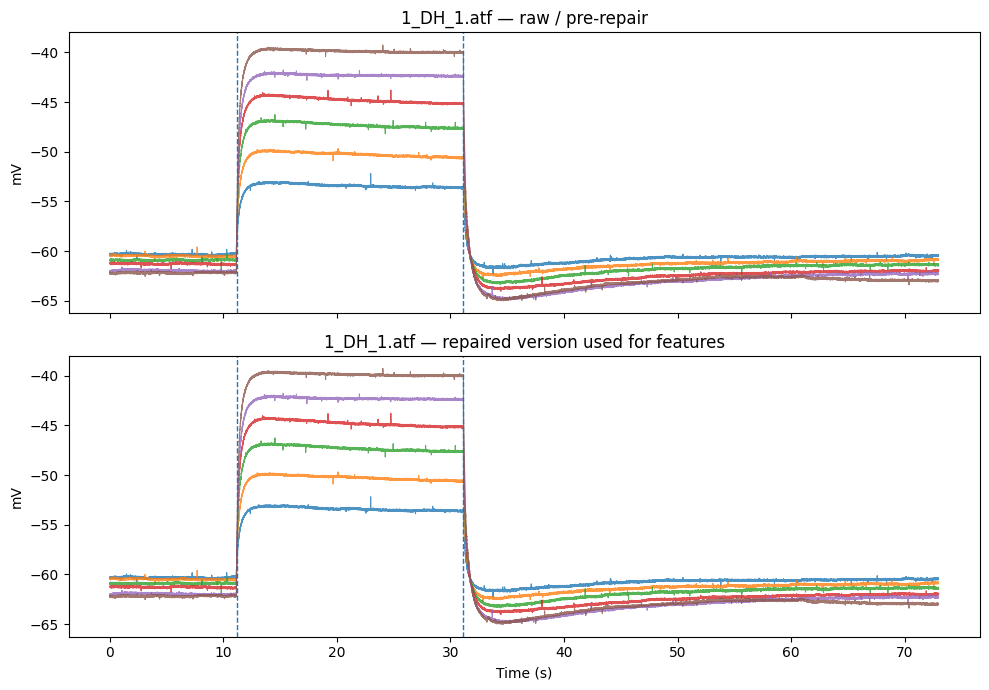

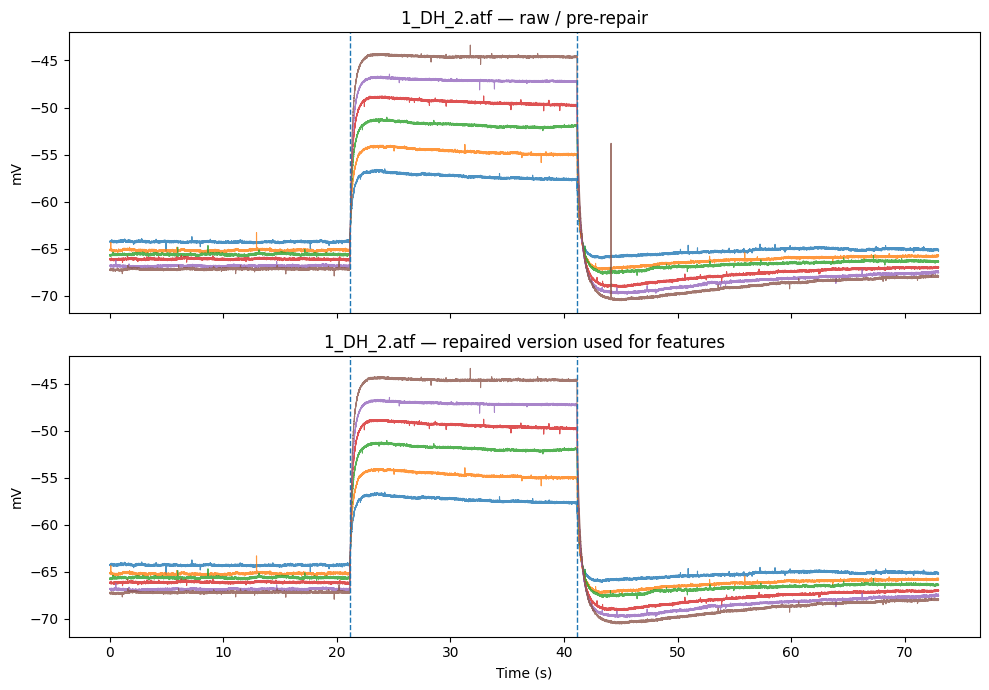

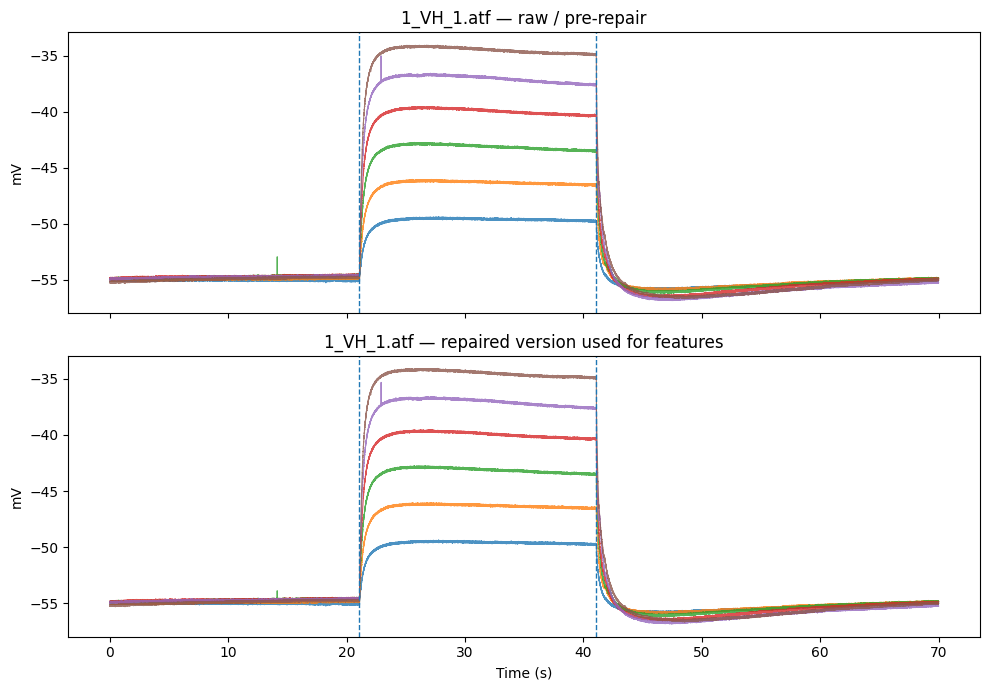

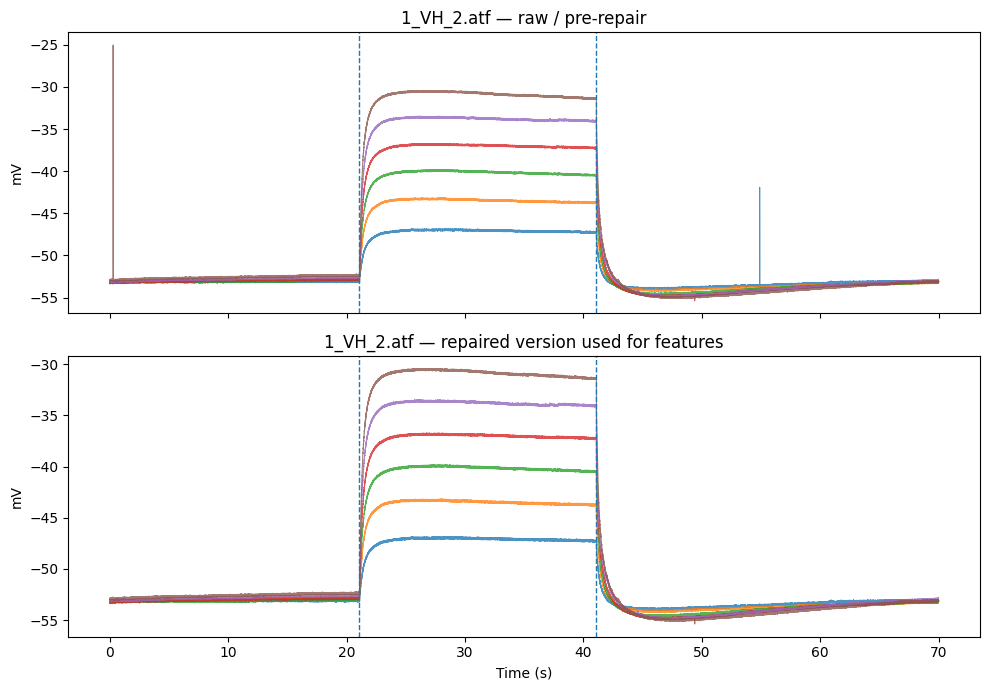

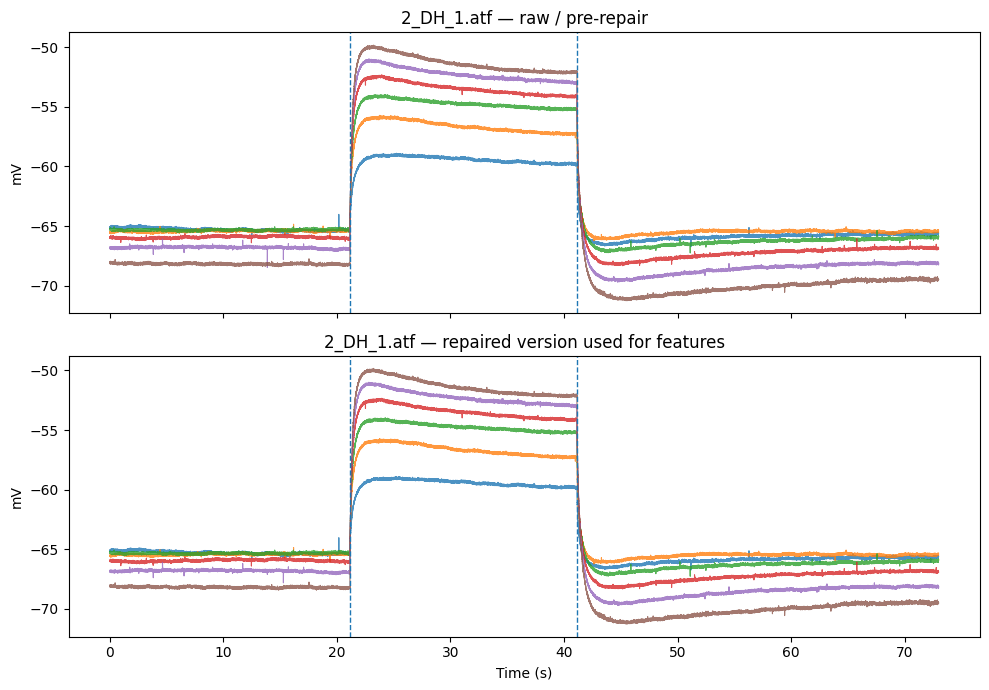

...

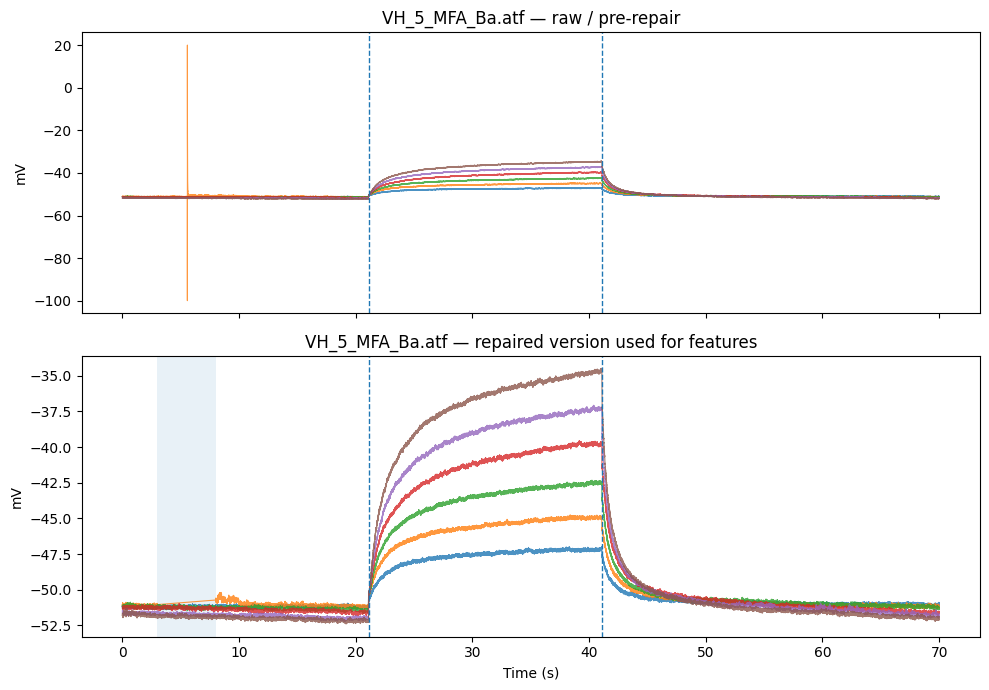

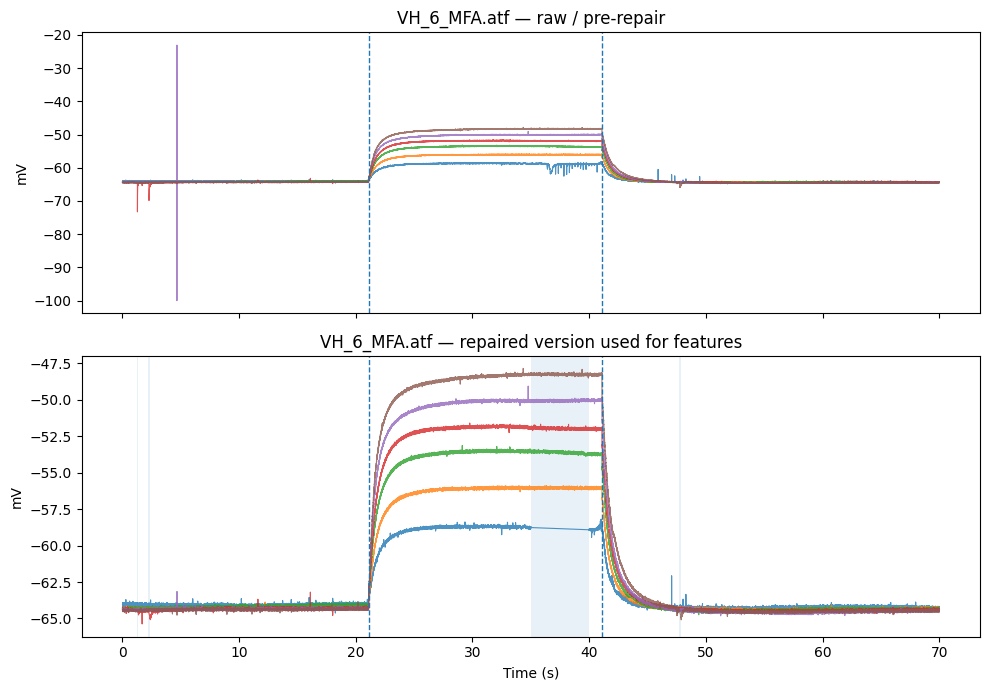

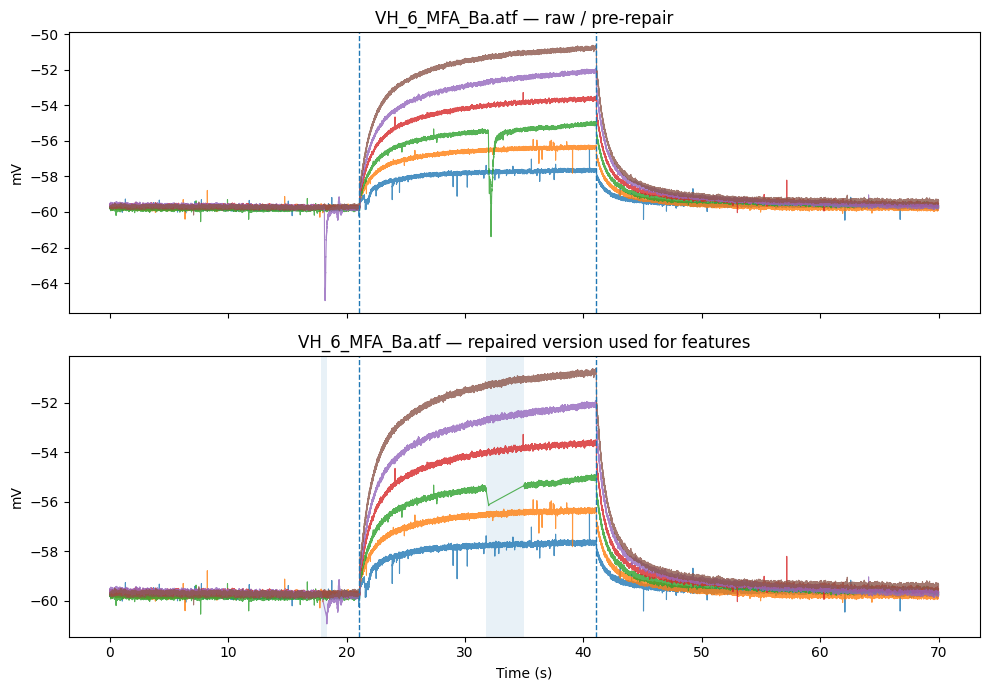

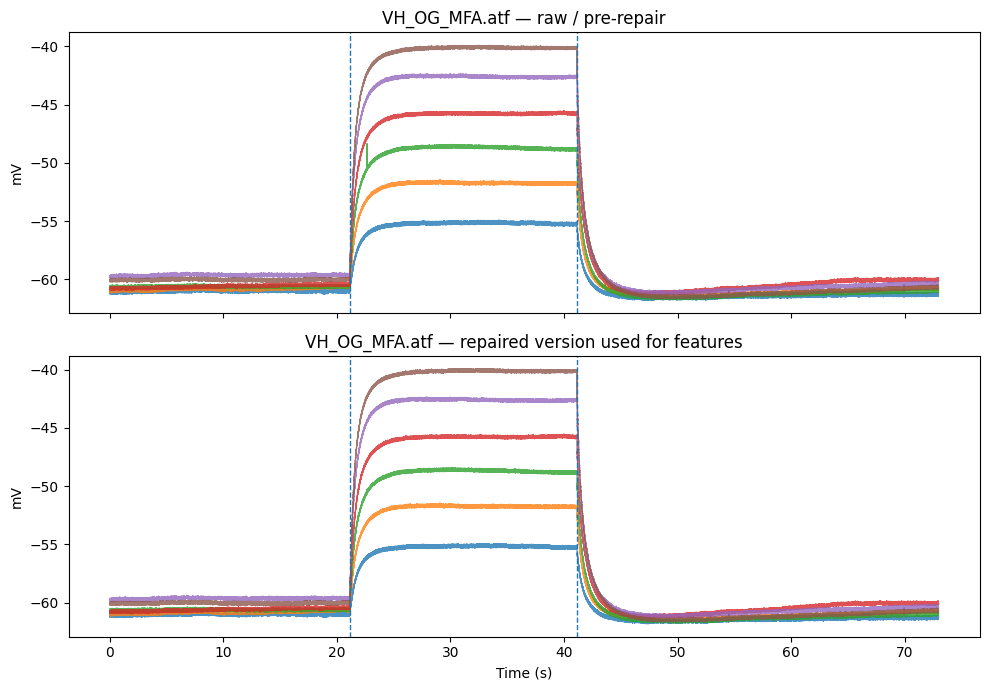

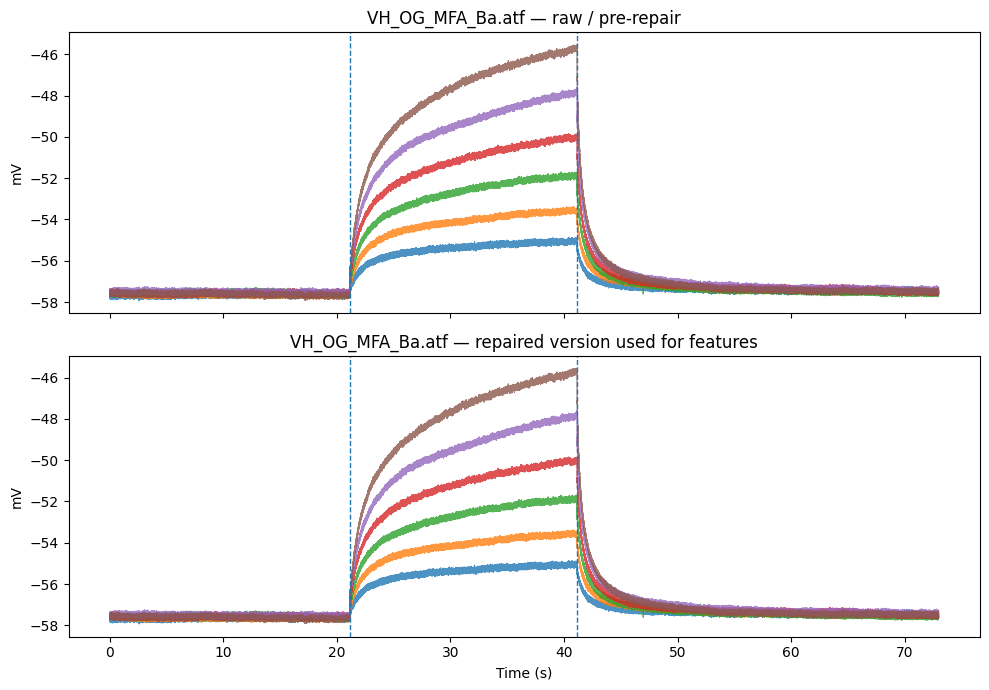

Saved all before/after plots to: /content/atf_from_google_drive/astro_feature_outputs_improved/all_visual_qc/before_after


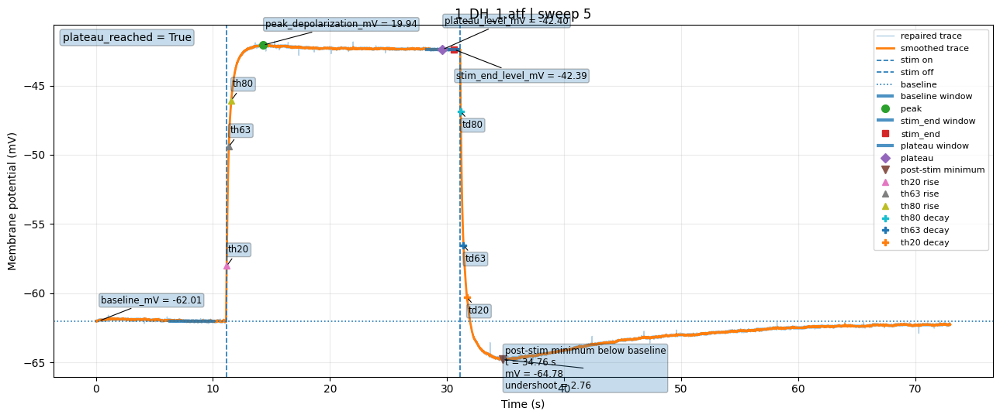

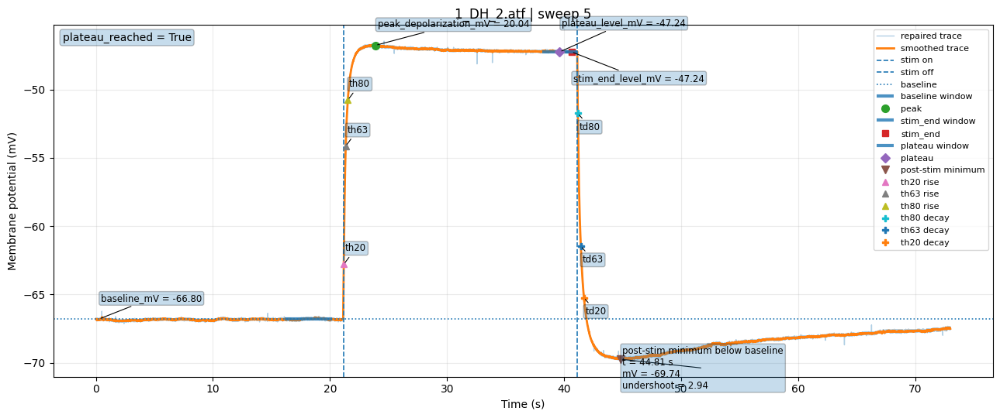

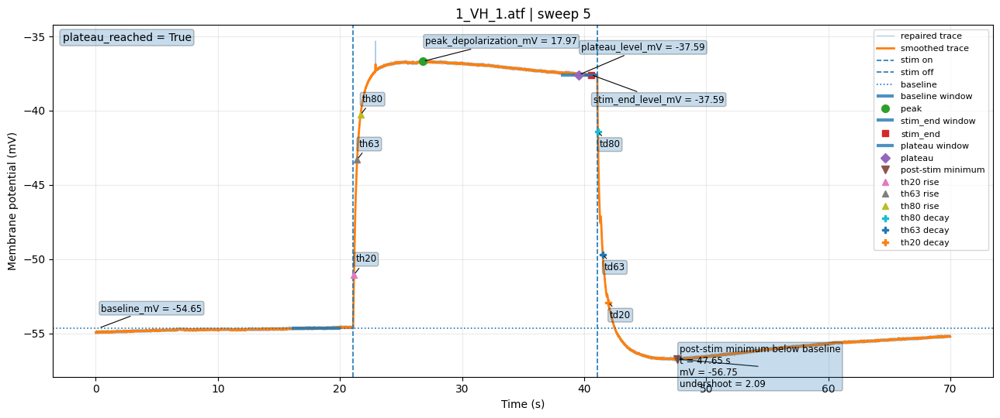

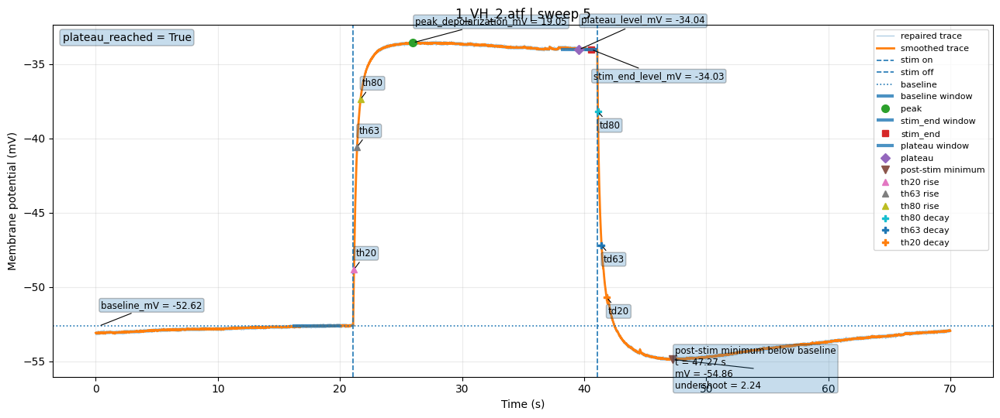

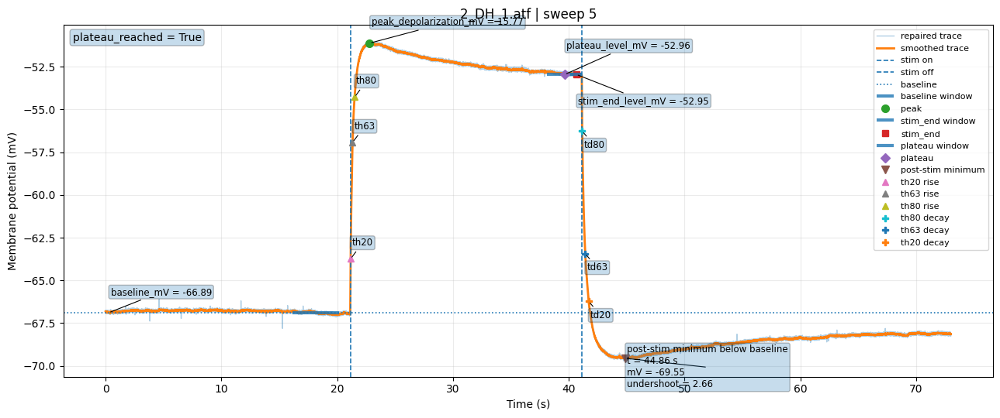

...

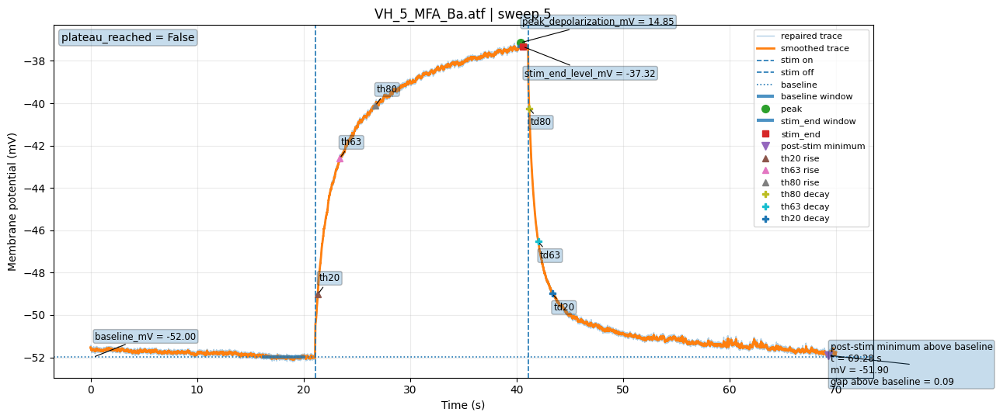

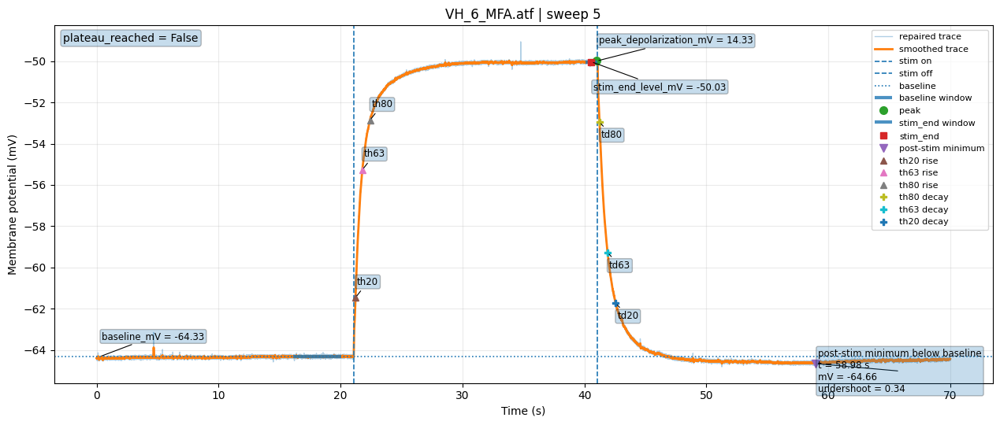

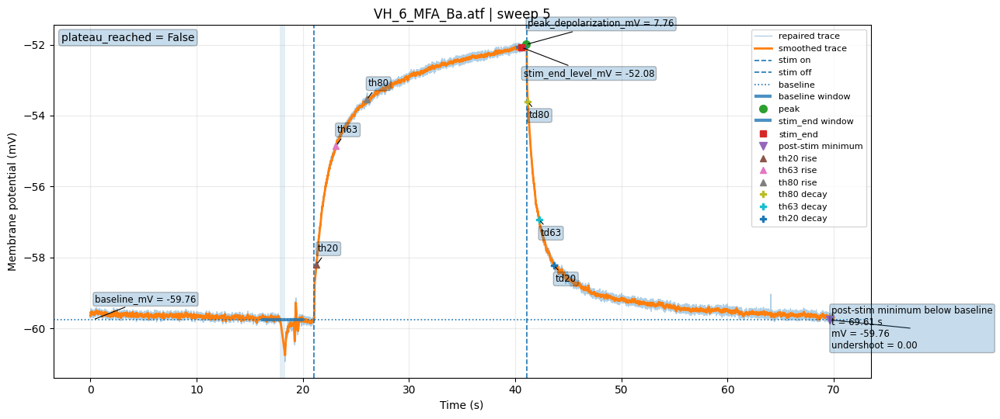

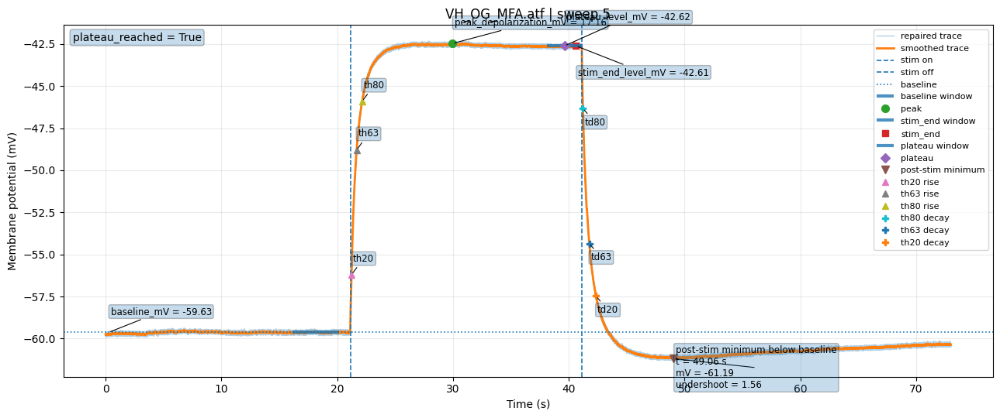

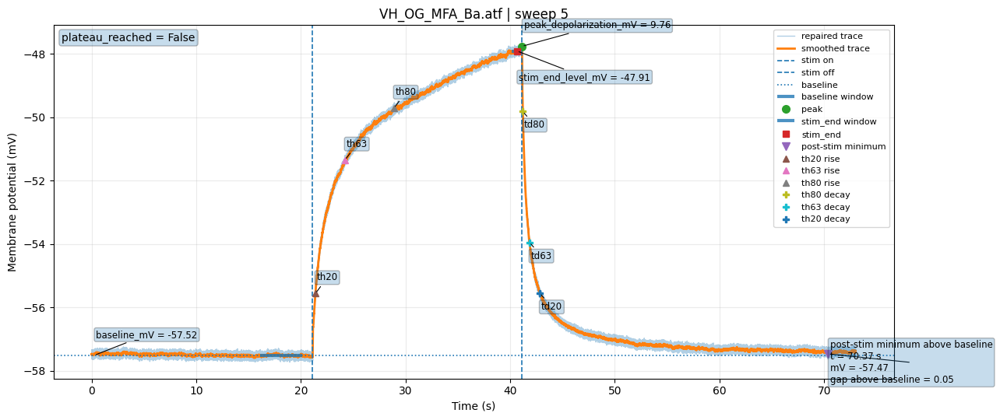

Saved all representative sweep plots to: /content/atf_from_google_drive/astro_feature_outputs_improved/all_visual_qc/representative_sweeps


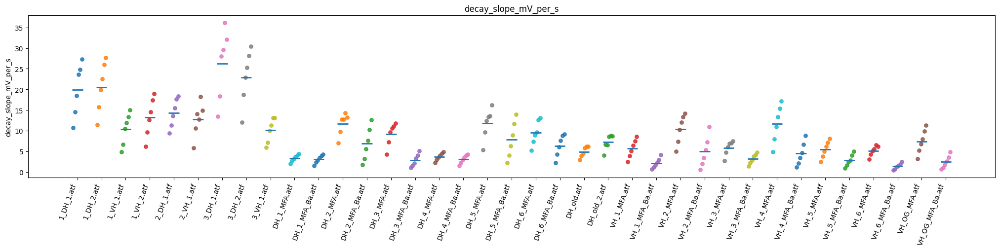

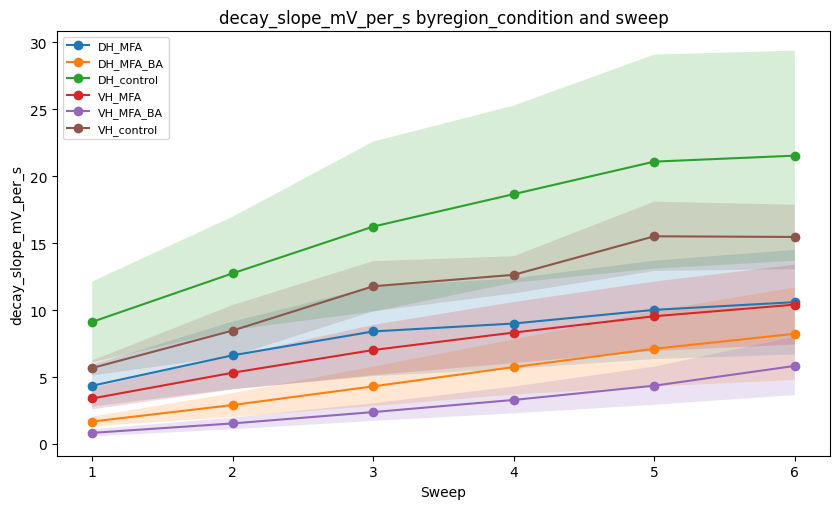

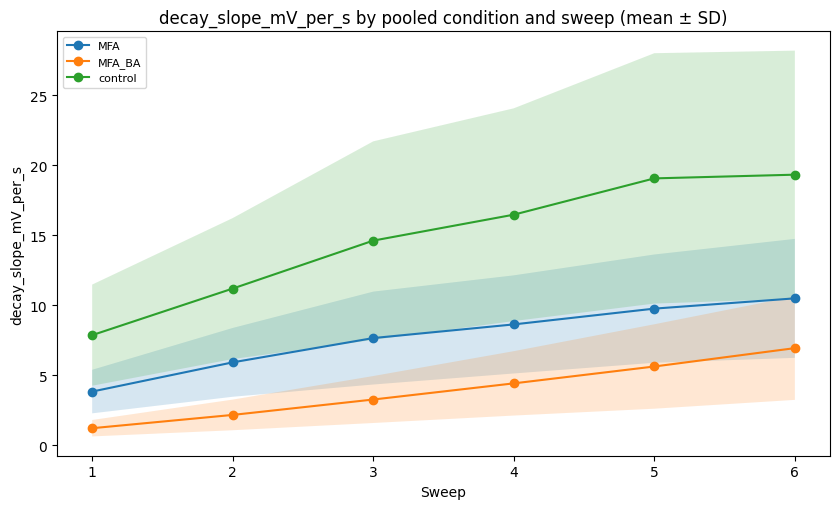

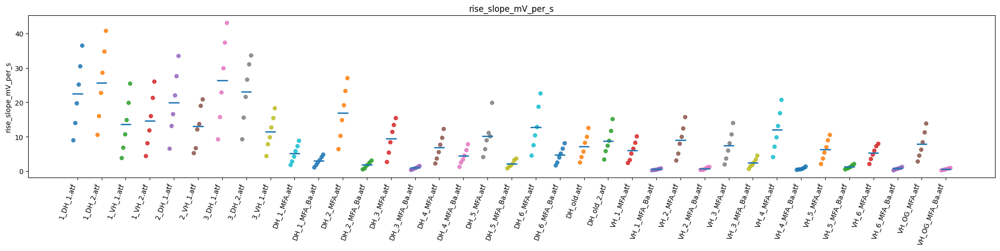

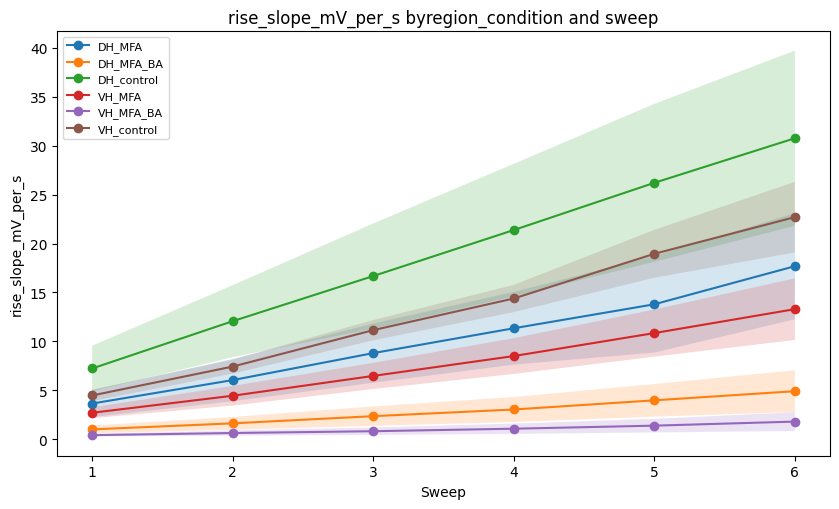

...

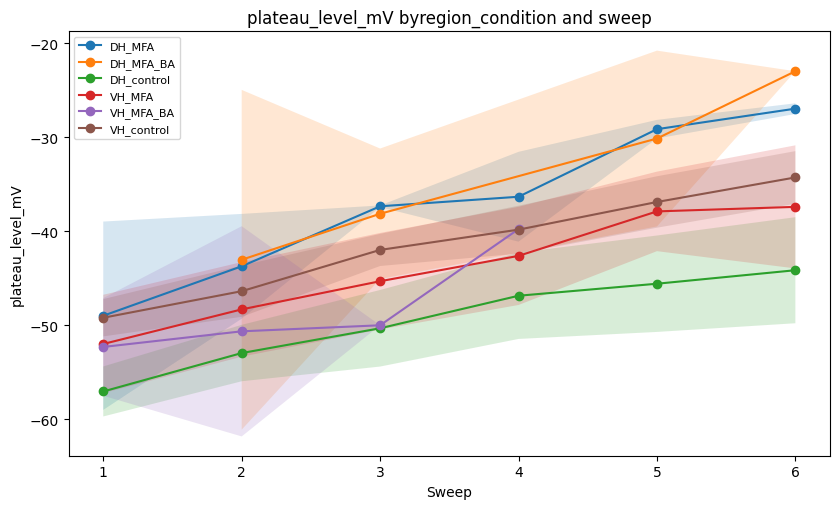

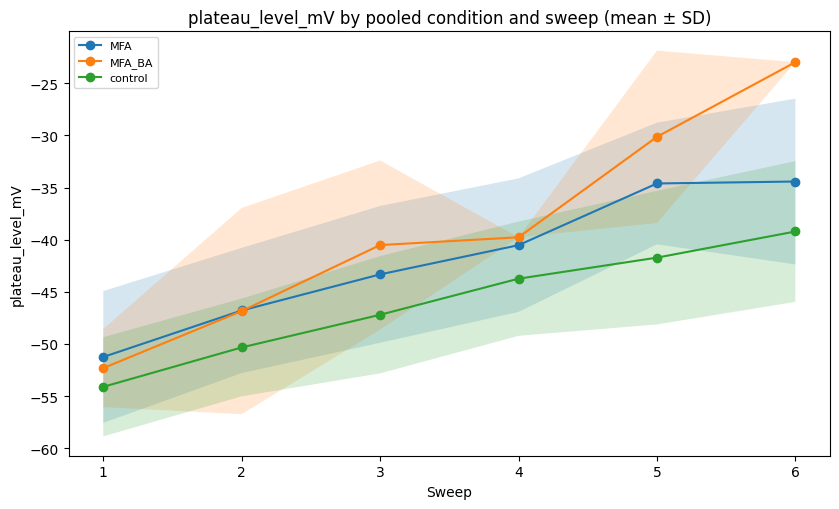

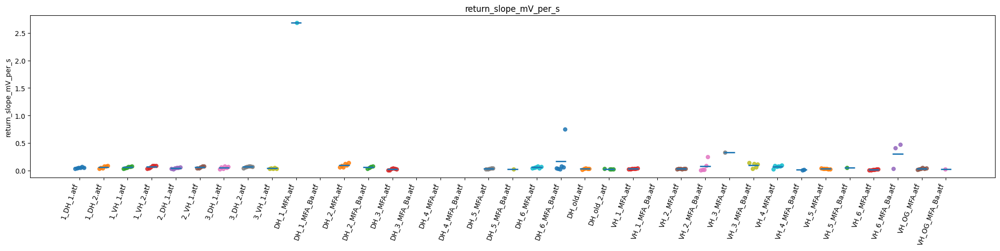

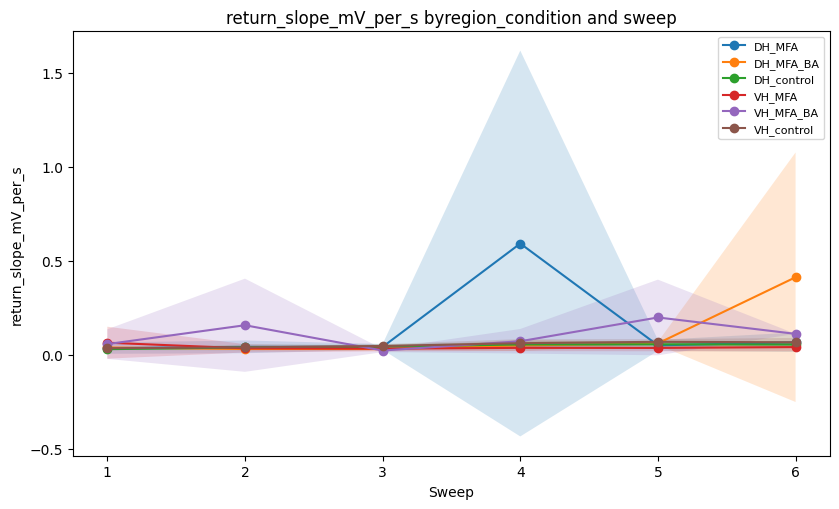

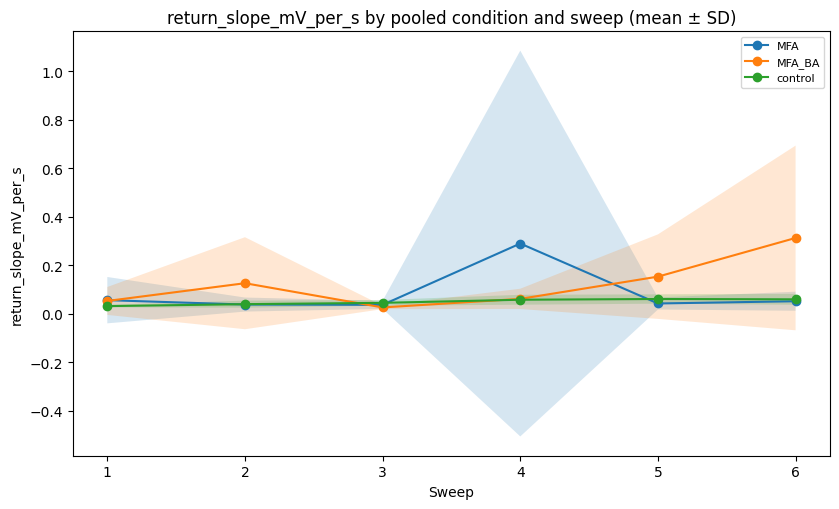

Saved all summary plots to: /content/atf_from_google_drive/astro_feature_outputs_improved/all_visual_qc


In [18]:
prepare_plotting_state(force_recompute=True)
#plot_all_before_after_files(show=True)
#plot_all_representative_sweeps(sweep_num=1,show=True)
## or both at once:
plot_all_summary_plots(sweep_num=5,show=True)


## Statistical analysis layer for independent-cell recordings

These cells assume **each `.atf` file is a different patched cell**.

Design used here:
- independent experimental unit = `file`
- repeated measurements within file = `sweep`
- fixed biological factors = `region`, `condition`, `sweep`
- continuous kinetic features: linear mixed-effects models with random intercept for `file`
- binary kinetic outcomes: logistic GEE grouped by `file`
- planned follow-up contrasts: sweep-specific **independent-group** tests with FDR correction
- multivariate exploratory layer: PCA by sweep


In [ ]:

# ---------- statistical analysis imports and configuration ----------

import warnings
from pathlib import Path
from itertools import combinations

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.multitest import multipletests
from IPython.display import display

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

PRIMARY_CONTINUOUS_FEATURES = [
    "peak_depolarization_mV",
    "stim_end_depolarization_mV",
    "rise_slope_mV_per_s",
    "rise_tau_s",
    "decay_slope_mV_per_s",
    "decay_tau_s",
    "post_min_above_baseline_mV",
]

CONDITIONAL_CONTINUOUS_FEATURES = [
    "plateau_level_mV",
    "plateau_slope_mV_per_s",
    "undershoot_magnitude_mV",
    "return_slope_mV_per_s",
]

BINARY_FEATURES = [
    "plateau_reached",
    "has_undershoot",
]

ALL_STAT_FEATURES = PRIMARY_CONTINUOUS_FEATURES + CONDITIONAL_CONTINUOUS_FEATURES

PAIRWISE_FEATURES = PRIMARY_CONTINUOUS_FEATURES + CONDITIONAL_CONTINUOUS_FEATURES

# Omnibus model:
# feature ~ region + condition + sweep + region:condition + region:sweep + condition:sweep
#
# Keep sweep categorical because each sweep is a distinct stimulation level.
# Only switch the 3-way interaction on later if you have a strong reason and
# enough stable data for the feature subset being tested.
INCLUDE_THREE_WAY_INTERACTION = False
ALPHA_FDR = 0.05


In [ ]:

# ---------- build a statistics-ready table from the extracted features ----------

def _stats_formula_rhs(include_three_way=False):
    rhs = (
        "C(region) * C(condition) + "
        "C(sweep_cat) + "
        "C(region):C(sweep_cat) + "
        "C(condition):C(sweep_cat)"
    )
    if include_three_way:
        rhs += " + C(region):C(condition):C(sweep_cat)"
    return rhs


def _make_stats_output_dir(base_state):
    try:
        out_dir = base_state["output_dir"] / "statistical_analysis"
        out_dir.mkdir(parents=True, exist_ok=True)
        return out_dir
    except Exception:
        out_dir = Path.cwd() / "statistical_analysis"
        out_dir.mkdir(parents=True, exist_ok=True)
        print(f"Primary output directory was not writable. Using fallback: {out_dir}")
        return out_dir


def prepare_statistics_state(force_recompute=False, include_three_way=False):
    global STATS_STATE

    if (not force_recompute) and ("STATS_STATE" in globals()) and STATS_STATE:
        return STATS_STATE

    base_state = prepare_plotting_state(force_recompute=force_recompute)
    feature_df = base_state["feature_df"].copy()

    id_cols = ["file", "region", "condition", "group_label", "cell_label", "sweep"]
    numeric_cols = [
        c for c in feature_df.columns
        if c not in id_cols + ["step_source"]
        and pd.api.types.is_numeric_dtype(feature_df[c])
    ]

    # One row per file x sweep
    stats_df = (
        feature_df.groupby(id_cols, as_index=False)[numeric_cols]
        .mean(numeric_only=True)
        .copy()
    )

    stats_df["file_id"] = stats_df["file"].astype(str)
    stats_df["sweep_ord"] = stats_df["sweep"].astype(int)
    stats_df["sweep_cat"] = pd.Categorical(stats_df["sweep"].astype(str), ordered=True)
    stats_df["region"] = pd.Categorical(stats_df["region"], categories=["DH", "VH"])
    stats_df["condition"] = pd.Categorical(stats_df["condition"], categories=["control", "MFA", "MFA_BA"])
    stats_df["group_label"] = pd.Categorical(stats_df["group_label"])

    available_primary = [c for c in PRIMARY_CONTINUOUS_FEATURES if c in stats_df.columns and stats_df[c].notna().sum() >= 12]
    available_conditional = [c for c in CONDITIONAL_CONTINUOUS_FEATURES if c in stats_df.columns and stats_df[c].notna().sum() >= 8]
    available_binary = [c for c in BINARY_FEATURES if c in stats_df.columns]

    counts_by_group = (
        stats_df.groupby(["region", "condition"], observed=False, as_index=False)
        .agg(n_files=("file_id", "nunique"))
        .sort_values(["region", "condition"])
        .reset_index(drop=True)
    )

    counts_by_group_sweep = (
        stats_df.groupby(["region", "condition", "sweep"], observed=False, as_index=False)
        .agg(n_files=("file_id", "nunique"))
        .sort_values(["region", "condition", "sweep"])
        .reset_index(drop=True)
    )

    feature_availability = []
    for c in available_primary + available_conditional + available_binary:
        tmp = {
            "feature": c,
            "n_nonmissing_rows": int(stats_df[c].notna().sum()),
        }
        if c in available_binary:
            vals = pd.Series(stats_df[c]).dropna().astype(int)
            tmp["n_positive"] = int((vals == 1).sum())
            tmp["n_zero"] = int((vals == 0).sum())
            tmp["family"] = "binary"
        elif c in available_conditional:
            tmp["family"] = "conditional_continuous"
        else:
            tmp["family"] = "primary_continuous"
        feature_availability.append(tmp)
    feature_availability_df = pd.DataFrame(feature_availability)

    stats_output_dir = _make_stats_output_dir(base_state)
    counts_by_group.to_csv(stats_output_dir / "counts_by_region_condition.csv", index=False)
    counts_by_group_sweep.to_csv(stats_output_dir / "counts_by_region_condition_sweep.csv", index=False)
    feature_availability_df.to_csv(stats_output_dir / "feature_availability_for_stats.csv", index=False)

    STATS_STATE = {
        "base_state": base_state,
        "stats_df": stats_df,
        "primary_continuous_features": available_primary,
        "conditional_continuous_features": available_conditional,
        "binary_features": available_binary,
        "formula_rhs": _stats_formula_rhs(include_three_way=include_three_way),
        "stats_output_dir": stats_output_dir,
        "counts_by_group": counts_by_group,
        "counts_by_group_sweep": counts_by_group_sweep,
        "feature_availability_df": feature_availability_df,
    }

    print("Statistics state prepared.")
    print("Rows (file x sweep):", len(stats_df))
    print("Files:", stats_df["file_id"].nunique())
    print("Primary continuous features:", available_primary)
    print("Conditional continuous features:", available_conditional)
    print("Binary features:", available_binary)
    display(counts_by_group)
    display(counts_by_group_sweep)
    display(feature_availability_df)

    return STATS_STATE


STATS_STATE = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)


In [ ]:

# ---------- omnibus mixed-effects models for continuous features ----------

def fit_mixedlm_feature(stats_df, feature_name, formula_rhs=None):
    if formula_rhs is None:
        formula_rhs = _stats_formula_rhs(include_three_way=INCLUDE_THREE_WAY_INTERACTION)

    d = stats_df.dropna(subset=[feature_name, "region", "condition", "sweep_cat", "file_id"]).copy()
    if d["file_id"].nunique() < 6:
        raise ValueError(f"Too few files to fit mixed model for {feature_name}")

    formula = f'Q("{feature_name}") ~ {formula_rhs}'
    model = smf.mixedlm(formula=formula, data=d, groups=d["file_id"], re_formula="1")
    result = model.fit(reml=False, method="lbfgs", maxiter=500, disp=False)

    coef_df = pd.DataFrame({
        "feature": feature_name,
        "term": result.params.index.astype(str),
        "coef": result.params.values,
        "se": result.bse.values,
        "z_or_t": result.tvalues.values,
        "pvalue": result.pvalues.values,
        "ci_low": result.conf_int().iloc[:, 0].values,
        "ci_high": result.conf_int().iloc[:, 1].values,
        "converged": bool(result.converged),
        "n_obs": int(result.nobs),
        "n_files": int(d["file_id"].nunique()),
        "aic": float(result.aic),
        "bic": float(result.bic),
    })

    term_df = result.wald_test_terms(skip_single=False).table.reset_index().rename(columns={"index": "term"})
    if "statistic" in term_df.columns:
        term_df["statistic"] = term_df["statistic"].apply(lambda x: float(np.asarray(x).squeeze()))
    if "pvalue" in term_df.columns:
        term_df["pvalue"] = term_df["pvalue"].astype(float)

    term_df["feature"] = feature_name
    term_df["n_obs"] = int(result.nobs)
    term_df["n_files"] = int(d["file_id"].nunique())
    term_df["converged"] = bool(result.converged)

    return result, coef_df, term_df


def run_mixedlm_screening(feature_list, family_label):
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    stats_df = state["stats_df"]

    all_coef = []
    all_terms = []
    fitted_models = {}

    for feature_name in feature_list:
        try:
            result, coef_df, term_df = fit_mixedlm_feature(
                stats_df=stats_df,
                feature_name=feature_name,
                formula_rhs=state["formula_rhs"],
            )
            coef_df["family"] = family_label
            term_df["family"] = family_label
            fitted_models[feature_name] = result
            all_coef.append(coef_df)
            all_terms.append(term_df)
            print(f"[mixedlm] fitted: {feature_name}")
        except Exception as exc:
            print(f"[mixedlm] skipped {feature_name}: {exc}")

    if not all_terms:
        return None

    coef_df = pd.concat(all_coef, ignore_index=True)
    term_df = pd.concat(all_terms, ignore_index=True)

    mask = ~term_df["term"].astype(str).isin(["Intercept", "Group Var"])
    if mask.any():
        reject, qvals, _, _ = multipletests(term_df.loc[mask, "pvalue"].values, method="fdr_bh")
        term_df.loc[mask, "qvalue_bh"] = qvals
        term_df.loc[mask, "reject_bh_0p05"] = reject
    term_df.loc[~mask, "qvalue_bh"] = np.nan
    term_df.loc[~mask, "reject_bh_0p05"] = False

    out_dir = state["stats_output_dir"]
    coef_path = out_dir / f"mixedlm_{family_label}_coefficients.csv"
    terms_path = out_dir / f"mixedlm_{family_label}_term_tests.csv"
    coef_df.to_csv(coef_path, index=False)
    term_df.to_csv(terms_path, index=False)

    print("Saved:")
    print(" -", coef_path)
    print(" -", terms_path)

    return {
        "models": fitted_models,
        "coef_df": coef_df,
        "terms_df": term_df,
    }


def plot_mixedlm_term_heatmap(terms_df, title_suffix=""):
    plot_df = terms_df.copy()
    plot_df = plot_df[~plot_df["term"].isin(["Intercept", "Group Var"])]
    keep_terms = [
        "C(region)",
        "C(condition)",
        "C(sweep_cat)",
        "C(region):C(condition)",
        "C(region):C(sweep_cat)",
        "C(condition):C(sweep_cat)",
        "C(region):C(condition):C(sweep_cat)",
    ]
    plot_df = plot_df[plot_df["term"].isin(keep_terms)]
    if plot_df.empty:
        print("No omnibus term table to plot.")
        return

    mat = (
        plot_df.pivot_table(index="term", columns="feature", values="qvalue_bh", aggfunc="first")
        .reindex([t for t in keep_terms if t in plot_df["term"].unique()])
    )
    values = -np.log10(mat.astype(float).clip(lower=1e-12))

    fig, ax = plt.subplots(figsize=(1.2 * max(6, mat.shape[1]), 0.8 * max(4, mat.shape[0])))
    im = ax.imshow(values, aspect="auto")
    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, rotation=60, ha="right")
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index)
    ax.set_title(f"-log10(BH q-value): mixed-model omnibus terms {title_suffix}".strip())
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("-log10(q)")
    plt.tight_layout()
    plt.show()


MIXEDLM_PRIMARY_RESULTS = run_mixedlm_screening(
    feature_list=STATS_STATE["primary_continuous_features"],
    family_label="primary_continuous",
)
if MIXEDLM_PRIMARY_RESULTS is not None:
    display(MIXEDLM_PRIMARY_RESULTS["terms_df"].sort_values(["qvalue_bh", "pvalue"]).head(30))
    plot_mixedlm_term_heatmap(MIXEDLM_PRIMARY_RESULTS["terms_df"], title_suffix="(primary)")

MIXEDLM_CONDITIONAL_RESULTS = run_mixedlm_screening(
    feature_list=STATS_STATE["conditional_continuous_features"],
    family_label="conditional_continuous",
)
if MIXEDLM_CONDITIONAL_RESULTS is not None:
    display(MIXEDLM_CONDITIONAL_RESULTS["terms_df"].sort_values(["qvalue_bh", "pvalue"]).head(30))
    plot_mixedlm_term_heatmap(MIXEDLM_CONDITIONAL_RESULTS["terms_df"], title_suffix="(conditional)")


In [ ]:

# ---------- omnibus logistic GEE for binary outcomes ----------

def fit_gee_binary_feature(stats_df, feature_name, formula_rhs=None):
    if formula_rhs is None:
        formula_rhs = _stats_formula_rhs(include_three_way=INCLUDE_THREE_WAY_INTERACTION)

    d = stats_df.dropna(subset=[feature_name, "region", "condition", "sweep_cat", "file_id"]).copy()
    d = d[d[feature_name].isin([0, 1, False, True])].copy()
    d[feature_name] = d[feature_name].astype(int)

    if d["file_id"].nunique() < 6:
        raise ValueError(f"Too few files for GEE on {feature_name}")
    if d[feature_name].nunique() < 2:
        raise ValueError(f"{feature_name} has only one observed class")

    formula = f"{feature_name} ~ {formula_rhs}"

    try:
        model = smf.gee(
            formula=formula,
            groups="file_id",
            data=d,
            family=sm.families.Binomial(),
            cov_struct=sm.cov_struct.Exchangeable(),
        )
        result = model.fit()
        cov_label = "exchangeable"
    except Exception:
        model = smf.gee(
            formula=formula,
            groups="file_id",
            data=d,
            family=sm.families.Binomial(),
            cov_struct=sm.cov_struct.Independence(),
        )
        result = model.fit()
        cov_label = "independence"

    coef_df = pd.DataFrame({
        "feature": feature_name,
        "term": result.params.index.astype(str),
        "coef_log_odds": result.params.values,
        "se": result.bse.values,
        "z": result.tvalues.values,
        "pvalue": result.pvalues.values,
        "odds_ratio": np.exp(result.params.values),
        "ci_low_or": np.exp(result.conf_int().iloc[:, 0].values),
        "ci_high_or": np.exp(result.conf_int().iloc[:, 1].values),
        "n_obs": int(result.nobs),
        "n_files": int(d["file_id"].nunique()),
        "working_correlation": cov_label,
    })

    term_df = result.wald_test_terms(skip_single=False).table.reset_index().rename(columns={"index": "term"})
    if "statistic" in term_df.columns:
        term_df["statistic"] = term_df["statistic"].apply(lambda x: float(np.asarray(x).squeeze()))
    if "pvalue" in term_df.columns:
        term_df["pvalue"] = term_df["pvalue"].astype(float)

    term_df["feature"] = feature_name
    term_df["n_obs"] = int(result.nobs)
    term_df["n_files"] = int(d["file_id"].nunique())
    term_df["working_correlation"] = cov_label

    return result, coef_df, term_df


def run_gee_binary_screening(feature_list):
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    stats_df = state["stats_df"]

    all_coef = []
    all_terms = []
    fitted_models = {}

    for feature_name in feature_list:
        try:
            result, coef_df, term_df = fit_gee_binary_feature(
                stats_df=stats_df,
                feature_name=feature_name,
                formula_rhs=state["formula_rhs"],
            )
            fitted_models[feature_name] = result
            all_coef.append(coef_df)
            all_terms.append(term_df)
            print(f"[gee] fitted: {feature_name}")
        except Exception as exc:
            print(f"[gee] skipped {feature_name}: {exc}")

    if not all_terms:
        return None

    coef_df = pd.concat(all_coef, ignore_index=True)
    term_df = pd.concat(all_terms, ignore_index=True)

    mask = ~term_df["term"].astype(str).isin(["Intercept"])
    if mask.any():
        reject, qvals, _, _ = multipletests(term_df.loc[mask, "pvalue"].values, method="fdr_bh")
        term_df.loc[mask, "qvalue_bh"] = qvals
        term_df.loc[mask, "reject_bh_0p05"] = reject
    term_df.loc[~mask, "qvalue_bh"] = np.nan
    term_df.loc[~mask, "reject_bh_0p05"] = False

    out_dir = state["stats_output_dir"]
    coef_path = out_dir / "gee_binary_coefficients.csv"
    terms_path = out_dir / "gee_binary_term_tests.csv"
    coef_df.to_csv(coef_path, index=False)
    term_df.to_csv(terms_path, index=False)

    print("Saved:")
    print(" -", coef_path)
    print(" -", terms_path)

    return {
        "models": fitted_models,
        "coef_df": coef_df,
        "terms_df": term_df,
    }


GEE_BINARY_RESULTS = run_gee_binary_screening(STATS_STATE["binary_features"])
if GEE_BINARY_RESULTS is not None:
    display(GEE_BINARY_RESULTS["terms_df"].sort_values(["qvalue_bh", "pvalue"]).head(20))


In [ ]:

# ---------- planned sweep-specific follow-up contrasts (independent groups) ----------

def hedges_g(x, y):
    x = np.asarray(pd.Series(x).dropna(), dtype=float)
    y = np.asarray(pd.Series(y).dropna(), dtype=float)
    nx, ny = len(x), len(y)
    if nx < 2 or ny < 2:
        return np.nan
    sx = np.var(x, ddof=1)
    sy = np.var(y, ddof=1)
    s_pooled = np.sqrt(((nx - 1) * sx + (ny - 1) * sy) / (nx + ny - 2))
    if not np.isfinite(s_pooled) or s_pooled == 0:
        return np.nan
    d = (np.mean(x) - np.mean(y)) / s_pooled
    correction = 1 - (3 / (4 * (nx + ny) - 9))
    return float(correction * d)


def build_planned_contrasts():
    contrasts = []

    # Region comparisons within condition
    for condition in ["control", "MFA", "MFA_BA"]:
        contrasts.append({
            "contrast_family": "region_within_condition",
            "label": f"DH_vs_VH__{condition}",
            "subset_query": f'condition == "{condition}"',
            "group_col": "region",
            "group_1": "DH",
            "group_2": "VH",
        })

    # Condition comparisons within region
    for region in ["DH", "VH"]:
        for cond1, cond2 in [("control", "MFA"), ("control", "MFA_BA"), ("MFA", "MFA_BA")]:
            contrasts.append({
                "contrast_family": "condition_within_region",
                "label": f"{cond1}_vs_{cond2}__{region}",
                "subset_query": f'region == "{region}"',
                "group_col": "condition",
                "group_1": cond1,
                "group_2": cond2,
            })

    return contrasts


def run_pairwise_sweep_followups(features=None):
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    d = state["stats_df"].copy()
    features = [f for f in (PAIRWISE_FEATURES if features is None else features) if f in d.columns]
    planned_contrasts = build_planned_contrasts()

    rows = []
    for spec in planned_contrasts:
        ds = d.query(spec["subset_query"]).copy()
        for sweep_val in sorted(ds["sweep"].dropna().unique()):
            dsw = ds[ds["sweep"] == sweep_val].copy()
            x_mask = dsw[spec["group_col"]].astype(str) == spec["group_1"]
            y_mask = dsw[spec["group_col"]].astype(str) == spec["group_2"]

            for feature_name in features:
                x = dsw.loc[x_mask, feature_name].dropna().astype(float)
                y = dsw.loc[y_mask, feature_name].dropna().astype(float)
                if len(x) < 2 or len(y) < 2:
                    continue

                t_stat, p_val = stats.ttest_ind(x, y, equal_var=False, nan_policy="omit")

                rows.append({
                    "contrast_family": spec["contrast_family"],
                    "contrast_label": spec["label"],
                    "sweep": int(sweep_val),
                    "feature": feature_name,
                    "n_1": int(len(x)),
                    "n_2": int(len(y)),
                    "group_1": spec["group_1"],
                    "group_2": spec["group_2"],
                    "mean_1": float(np.mean(x)),
                    "mean_2": float(np.mean(y)),
                    "mean_diff_1_minus_2": float(np.mean(x) - np.mean(y)),
                    "hedges_g": hedges_g(x, y),
                    "welch_t": float(t_stat),
                    "pvalue": float(p_val),
                })

    pairwise_df = pd.DataFrame(rows)
    if len(pairwise_df):
        reject, qvals, _, _ = multipletests(pairwise_df["pvalue"].values, method="fdr_bh")
        pairwise_df["qvalue_bh"] = qvals
        pairwise_df["reject_bh_0p05"] = reject

        out_path = state["stats_output_dir"] / "planned_pairwise_sweep_followups.csv"
        pairwise_df.to_csv(out_path, index=False)
        print("Saved:", out_path)

    return pairwise_df


def plot_pairwise_effect_size_heatmap(pairwise_df, contrast_label):
    d = pairwise_df[pairwise_df["contrast_label"] == contrast_label].copy()
    if d.empty:
        print(f"No results for contrast {contrast_label}")
        return

    mat = d.pivot_table(index="sweep", columns="feature", values="hedges_g", aggfunc="first").sort_index()
    fig, ax = plt.subplots(figsize=(1.1 * max(6, mat.shape[1]), 0.8 * max(4, mat.shape[0])))
    im = ax.imshow(mat.values, aspect="auto")
    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, rotation=60, ha="right")
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index)
    ax.set_title(f"Hedges g by sweep: {contrast_label}")
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Hedges g")
    plt.tight_layout()
    plt.show()


PAIRWISE_SWEEP_RESULTS = run_pairwise_sweep_followups()
display(PAIRWISE_SWEEP_RESULTS.sort_values(["qvalue_bh", "pvalue"]).head(30))

# Example:
# plot_pairwise_effect_size_heatmap(PAIRWISE_SWEEP_RESULTS, "DH_vs_VH__control")


In [ ]:

# ---------- optional targeted permutation re-tests for selected follow-up results ----------

def _mean_diff(x, y, axis=0):
    return np.mean(x, axis=axis) - np.mean(y, axis=axis)


def rerun_selected_permutation_tests(selected_rows, n_resamples=9999, random_state=42):
    """
    Re-test a selected subset of pairwise results with permutation p-values.
    selected_rows: DataFrame, typically a filtered subset of PAIRWISE_SWEEP_RESULTS
    """
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    d = state["stats_df"].copy()

    out_rows = []
    for _, row in selected_rows.iterrows():
        if row["contrast_family"] == "region_within_condition":
            ds = d.query(f'condition == "{row["contrast_label"].split("__")[1]}" and sweep == {int(row["sweep"])}')
            x = ds.loc[ds["region"].astype(str) == row["group_1"], row["feature"]].dropna().astype(float).values
            y = ds.loc[ds["region"].astype(str) == row["group_2"], row["feature"]].dropna().astype(float).values
        else:
            region = row["contrast_label"].split("__")[1]
            ds = d.query(f'region == "{region}" and sweep == {int(row["sweep"])}')
            x = ds.loc[ds["condition"].astype(str) == row["group_1"], row["feature"]].dropna().astype(float).values
            y = ds.loc[ds["condition"].astype(str) == row["group_2"], row["feature"]].dropna().astype(float).values

        if len(x) < 2 or len(y) < 2:
            continue

        perm = stats.permutation_test(
            data=(x, y),
            statistic=_mean_diff,
            permutation_type="independent",
            n_resamples=n_resamples,
            alternative="two-sided",
            random_state=random_state,
        )

        out = row.to_dict()
        out["perm_statistic"] = float(np.asarray(perm.statistic).squeeze())
        out["perm_pvalue"] = float(perm.pvalue)
        out_rows.append(out)

    perm_df = pd.DataFrame(out_rows)
    if len(perm_df):
        reject, qvals, _, _ = multipletests(perm_df["perm_pvalue"].values, method="fdr_bh")
        perm_df["perm_qvalue_bh"] = qvals
        perm_df["perm_reject_bh_0p05"] = reject

        out_path = state["stats_output_dir"] / "selected_permutation_followups.csv"
        perm_df.to_csv(out_path, index=False)
        print("Saved:", out_path)

    return perm_df


# Example usage:
# selected = PAIRWISE_SWEEP_RESULTS.query('qvalue_bh < 0.10').head(20)
# PERMUTATION_FOLLOWUPS = rerun_selected_permutation_tests(selected, n_resamples=9999)


In [ ]:

# ---------- exploratory multivariate layer: PCA by sweep ----------

def run_pca_all_rows(feature_cols=None, color_by="group_label"):
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    d = state["stats_df"].copy()
    feature_cols = state["primary_continuous_features"] if feature_cols is None else feature_cols

    X = d[feature_cols].copy()
    pipe = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("pca", PCA(n_components=2)),
    ])
    scores = pipe.fit_transform(X)
    pca = pipe.named_steps["pca"]

    scores_df = d[["file_id", "region", "condition", "group_label", "sweep"]].copy()
    scores_df["PC1"] = scores[:, 0]
    scores_df["PC2"] = scores[:, 1]

    loadings_df = pd.DataFrame(
        pca.components_.T,
        index=feature_cols,
        columns=["PC1_loading", "PC2_loading"],
    ).reset_index().rename(columns={"index": "feature"})

    fig, ax = plt.subplots(figsize=(8, 6))
    groups = scores_df[color_by].astype(str).unique()
    for g in groups:
        sub = scores_df[scores_df[color_by].astype(str) == g]
        ax.scatter(sub["PC1"], sub["PC2"], alpha=0.75, label=g)
    ax.set_xlabel(f"PC1 ({100 * pca.explained_variance_ratio_[0]:.1f}% var)")
    ax.set_ylabel(f"PC2 ({100 * pca.explained_variance_ratio_[1]:.1f}% var)")
    ax.set_title(f"PCA of kinetic features colored by {color_by}")
    ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

    out_dir = state["stats_output_dir"]
    scores_df.to_csv(out_dir / f"pca_scores_all_rows_by_{color_by}.csv", index=False)
    loadings_df.to_csv(out_dir / "pca_loadings_all_rows.csv", index=False)

    return {"scores_df": scores_df, "loadings_df": loadings_df, "explained_variance_ratio": pca.explained_variance_ratio_}


def plot_pca_by_sweep(feature_cols=None, color_by="group_label"):
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    d = state["stats_df"].copy()
    feature_cols = state["primary_continuous_features"] if feature_cols is None else feature_cols

    sweeps = sorted(d["sweep"].dropna().unique())
    ncols = 3
    nrows = int(np.ceil(len(sweeps) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.2 * nrows), squeeze=False)

    all_scores = []
    all_loadings = []

    for ax, sweep_val in zip(axes.ravel(), sweeps):
        ds = d[d["sweep"] == sweep_val].copy()
        if len(ds) < 4:
            ax.axis("off")
            continue

        X = ds[feature_cols].copy()
        pipe = Pipeline([
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler()),
            ("pca", PCA(n_components=2)),
        ])
        scores = pipe.fit_transform(X)
        pca = pipe.named_steps["pca"]

        scores_df = ds[["file_id", "region", "condition", "group_label", "sweep"]].copy()
        scores_df["PC1"] = scores[:, 0]
        scores_df["PC2"] = scores[:, 1]
        scores_df["sweep"] = int(sweep_val)
        all_scores.append(scores_df)

        loadings_df = pd.DataFrame(
            pipe.named_steps["pca"].components_.T,
            index=feature_cols,
            columns=["PC1_loading", "PC2_loading"],
        ).reset_index().rename(columns={"index": "feature"})
        loadings_df["sweep"] = int(sweep_val)
        all_loadings.append(loadings_df)

        groups = scores_df[color_by].astype(str).unique()
        for g in groups:
            sub = scores_df[scores_df[color_by].astype(str) == g]
            ax.scatter(sub["PC1"], sub["PC2"], alpha=0.75, label=g)
        ax.set_title(f"Sweep {int(sweep_val)}")
        ax.set_xlabel(f"PC1 ({100 * pca.explained_variance_ratio_[0]:.1f}%)")
        ax.set_ylabel(f"PC2 ({100 * pca.explained_variance_ratio_[1]:.1f}%)")

    for ax in axes.ravel()[len(sweeps):]:
        ax.axis("off")

    handles, labels = axes.ravel()[0].get_legend_handles_labels()
    if labels:
        fig.legend(handles, labels, loc="upper right", fontsize=8)
    fig.suptitle(f"PCA by sweep colored by {color_by}", y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()

    out_dir = state["stats_output_dir"]
    if all_scores:
        pd.concat(all_scores, ignore_index=True).to_csv(out_dir / f"pca_scores_by_sweep_by_{color_by}.csv", index=False)
    if all_loadings:
        pd.concat(all_loadings, ignore_index=True).to_csv(out_dir / "pca_loadings_by_sweep.csv", index=False)


PCA_ALL_ROWS = run_pca_all_rows(color_by="group_label")
plot_pca_by_sweep(color_by="group_label")


## Second statistical layer: delta-of-delta, sweep-trend slopes, pooled region-blind variability, correlation structure, and optional Bayesian models

This layer adds the analyses that are not explicit in the first layer:

1. **Delta-of-delta at matched sweeps**  
   For each feature and sweep, estimate:
   - `(DH_cond2 - DH_cond1) - (VH_cond2 - VH_cond1)`

2. **Numeric sweep-trend models**  
   Treat sweep as numeric to estimate:
   - `Mx_ij|DH`
   - `Mx_ij|VH`
   - `Delta[Mx_ij|DH - Mx_ij|VH]`

3. **Region-blind pooled variability**  
   Pool DH and VH while preserving condition and sweep labels.

4. **Correlation structure**  
   - all rows
   - by region
   - by condition
   - delta-feature profiles under condition contrasts

5. **Optional Bayesian targeted trend model**  
   For one feature at a time, fit a hierarchical Bayesian sweep-trend model.


In [ ]:

# ---------- second-layer configuration and shared helpers ----------

SECOND_LAYER_CONDITION_PAIRS = [
    ("control", "MFA"),
    ("MFA", "MFA_BA"),
    ("control", "MFA_BA"),
]

SECOND_LAYER_FEATURES = (
    STATS_STATE["primary_continuous_features"] +
    STATS_STATE["conditional_continuous_features"]
)

SECOND_LAYER_ALPHA_FDR = 0.05


def _second_layer_output_dir():
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    out_dir = state["stats_output_dir"] / "second_layer"
    out_dir.mkdir(parents=True, exist_ok=True)
    return out_dir


def _prepare_second_layer_df():
    state = prepare_statistics_state(force_recompute=False, include_three_way=INCLUDE_THREE_WAY_INTERACTION)
    d = state["stats_df"].copy()
    d["region"] = pd.Categorical(d["region"], categories=["DH", "VH"])
    d["condition"] = pd.Categorical(d["condition"], categories=["control", "MFA", "MFA_BA"])
    d["sweep_num"] = d["sweep"].astype(float)
    d["sweep_num_c"] = d["sweep_num"] - d["sweep_num"].mean()
    return d


def _bh_adjust(df, p_col="pvalue", q_col="qvalue_bh", rej_col="reject_bh_0p05"):
    df = df.copy()
    if p_col not in df.columns:
        df[p_col] = np.nan
    if len(df) == 0:
        df[q_col] = np.nan
        df[rej_col] = False
        return df
    mask = df[p_col].notna().values
    df[q_col] = np.nan
    df[rej_col] = False
    if mask.sum() > 0:
        reject, qvals, _, _ = multipletests(df.loc[mask, p_col].values, method="fdr_bh")
        df.loc[mask, q_col] = qvals
        df.loc[mask, rej_col] = reject
    return df


def _plot_heatmap_from_long(df, row_col, col_col, value_col, title, cmap="viridis"):
    if df.empty:
        print("No data to plot.")
        return
    mat = df.pivot_table(index=row_col, columns=col_col, values=value_col, aggfunc="first")
    mat = mat.sort_index()
    fig, ax = plt.subplots(figsize=(1.1 * max(6, mat.shape[1]), 0.8 * max(4, mat.shape[0])))
    im = ax.imshow(mat.values, aspect="auto")
    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, rotation=60, ha="right")
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index)
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label(value_col)
    plt.tight_layout()
    plt.show()


def _plot_signed_heatmap_from_long(df, row_col, col_col, value_col, title):
    if df.empty:
        print("No data to plot.")
        return
    mat = df.pivot_table(index=row_col, columns=col_col, values=value_col, aggfunc="first")
    mat = mat.sort_index()
    vmax = np.nanmax(np.abs(mat.values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0
    fig, ax = plt.subplots(figsize=(1.1 * max(6, mat.shape[1]), 0.8 * max(4, mat.shape[0])))
    im = ax.imshow(mat.values, aspect="auto", vmin=-vmax, vmax=vmax, cmap="coolwarm")
    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, rotation=60, ha="right")
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index)
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label(value_col)
    plt.tight_layout()
    plt.show()


def _condition_pair_label(cond1, cond2):
    return f"{cond1}_to_{cond2}"


In [ ]:

# ---------- matched-sweep delta-of-delta contrasts (difference of condition effects between regions) ----------

def fit_diffdiff_at_sweep(feature_name, sweep_value, cond1, cond2, robust_cov="HC3"):
    d = _prepare_second_layer_df()
    ds = d[(d["sweep"] == sweep_value) & (d["condition"].isin([cond1, cond2]))].copy()
    ds["region"] = pd.Categorical(ds["region"], categories=["DH", "VH"])
    ds["condition_pair"] = pd.Categorical(ds["condition"].astype(str), categories=[cond1, cond2])

    cell_counts = (
        ds.groupby(["region", "condition_pair"], observed=False)
        .size()
        .rename("n")
        .reset_index()
    )
    if len(cell_counts) < 4 or (cell_counts["n"] < 2).any():
        return None

    formula = f'Q("{feature_name}") ~ C(region) * C(condition_pair)'
    model = smf.ols(formula, data=ds).fit(cov_type=robust_cov)

    interaction_term = f"C(region)[T.VH]:C(condition_pair)[T.{cond2}]"
    if interaction_term not in model.params.index:
        return None

    ci = model.conf_int().loc[interaction_term]
    means = (
        ds.groupby(["region", "condition_pair"], observed=False)[feature_name]
        .mean()
        .unstack("condition_pair")
    )

    row = {
        "feature": feature_name,
        "sweep": int(sweep_value),
        "contrast_label": f"diffdiff__{_condition_pair_label(cond1, cond2)}",
        "cond_1": cond1,
        "cond_2": cond2,
        "n_DH_cond1": int(cell_counts.query('region == "DH" and condition_pair == @cond1')["n"].iloc[0]),
        "n_DH_cond2": int(cell_counts.query('region == "DH" and condition_pair == @cond2')["n"].iloc[0]),
        "n_VH_cond1": int(cell_counts.query('region == "VH" and condition_pair == @cond1')["n"].iloc[0]),
        "n_VH_cond2": int(cell_counts.query('region == "VH" and condition_pair == @cond2')["n"].iloc[0]),
        "mean_DH_cond1": float(means.loc["DH", cond1]),
        "mean_DH_cond2": float(means.loc["DH", cond2]),
        "mean_VH_cond1": float(means.loc["VH", cond1]),
        "mean_VH_cond2": float(means.loc["VH", cond2]),
        "diff_DH_cond2_minus_cond1": float(means.loc["DH", cond2] - means.loc["DH", cond1]),
        "diff_VH_cond2_minus_cond1": float(means.loc["VH", cond2] - means.loc["VH", cond1]),
        "delta_of_delta_DH_minus_VH": float((means.loc["DH", cond2] - means.loc["DH", cond1]) - (means.loc["VH", cond2] - means.loc["VH", cond1])),
        "estimate_VH_minus_DH_parameterization": float(model.params[interaction_term]),
        "se": float(model.bse[interaction_term]),
        "t_or_z": float(model.tvalues[interaction_term]),
        "pvalue": float(model.pvalues[interaction_term]),
        "ci_low": float(ci.iloc[0]),
        "ci_high": float(ci.iloc[1]),
        "robust_cov": robust_cov,
    }
    # convert parameterization to requested orientation (DH minus VH)
    row["estimate_DH_minus_VH"] = -row["estimate_VH_minus_DH_parameterization"]
    row["ci_low_DH_minus_VH"] = -row["ci_high"]
    row["ci_high_DH_minus_VH"] = -row["ci_low"]
    return row


def run_diffdiff_screen(features=None):
    d = _prepare_second_layer_df()
    features = [f for f in (SECOND_LAYER_FEATURES if features is None else features) if f in d.columns]

    rows = []
    for feature_name in features:
        for sweep_value in sorted(d["sweep"].dropna().unique()):
            for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
                out = fit_diffdiff_at_sweep(feature_name, sweep_value, cond1, cond2)
                if out is not None:
                    rows.append(out)

    diffdiff_df = pd.DataFrame(rows)
    diffdiff_df = _bh_adjust(diffdiff_df, p_col="pvalue", q_col="qvalue_bh", rej_col="reject_bh_0p05")

    out_dir = _second_layer_output_dir()
    out_path = out_dir / "matched_sweep_delta_of_delta.csv"
    diffdiff_df.to_csv(out_path, index=False)
    print("Saved:", out_path)
    return diffdiff_df


def plot_diffdiff_heatmap(diffdiff_df, contrast_label, value_col="estimate_DH_minus_VH"):
    d = diffdiff_df[diffdiff_df["contrast_label"] == contrast_label].copy()
    d["sweep_feature"] = d["sweep"].astype(int).astype(str)
    _plot_signed_heatmap_from_long(
        d,
        row_col="sweep",
        col_col="feature",
        value_col=value_col,
        title=f"Matched-sweep delta-of-delta ({contrast_label})",
    )


DIFFDIFF_RESULTS = run_diffdiff_screen()
display(DIFFDIFF_RESULTS.sort_values(["qvalue_bh", "pvalue"]).head(30) if len(DIFFDIFF_RESULTS) else DIFFDIFF_RESULTS)

# Example:
# plot_diffdiff_heatmap(DIFFDIFF_RESULTS, "diffdiff__control_to_MFA")


In [ ]:

# ---------- numeric sweep-trend models: slope within region, slope deltas within region, and delta-of-delta of slopes ----------

def fit_numeric_sweep_gee_feature(feature_name):
    d = _prepare_second_layer_df()
    d = d.dropna(subset=[feature_name, "region", "condition", "sweep_num_c", "file_id"]).copy()

    if d["file_id"].nunique() < 10:
        raise ValueError(f"Too few files for numeric sweep model on {feature_name}")

    formula = f'Q("{feature_name}") ~ C(region) * C(condition) * sweep_num_c'
    try:
        model = smf.gee(
            formula=formula,
            groups="file_id",
            data=d,
            family=sm.families.Gaussian(),
            cov_struct=sm.cov_struct.Exchangeable(),
        )
        result = model.fit()
        cov_label = "exchangeable"
    except Exception:
        model = smf.gee(
            formula=formula,
            groups="file_id",
            data=d,
            family=sm.families.Gaussian(),
            cov_struct=sm.cov_struct.Independence(),
        )
        result = model.fit()
        cov_label = "independence"

    return result, d, cov_label


def _slope_contrast_vector(param_names, region, condition):
    v = np.zeros(len(param_names), dtype=float)

    def add(term, value=1.0):
        if term in param_names:
            v[param_names.index(term)] += value

    add("sweep_num_c", 1.0)
    if region == "VH":
        add("C(region)[T.VH]:sweep_num_c", 1.0)
    if condition != "control":
        add(f"C(condition)[T.{condition}]:sweep_num_c", 1.0)
    if region == "VH" and condition != "control":
        add(f"C(region)[T.VH]:C(condition)[T.{condition}]:sweep_num_c", 1.0)

    return v


def _contrast_result_to_row(feature_name, label, result, contrast_vector, extra_cols=None):
    tt = result.t_test(contrast_vector)
    ci = tt.conf_int()[0]
    row = {
        "feature": feature_name,
        "label": label,
        "estimate": float(np.asarray(tt.effect).squeeze()),
        "se": float(np.asarray(tt.sd).squeeze()),
        "z_or_t": float(np.asarray(tt.tvalue).squeeze()),
        "pvalue": float(np.asarray(tt.pvalue).squeeze()),
        "ci_low": float(ci[0]),
        "ci_high": float(ci[1]),
    }
    if extra_cols is not None:
        row.update(extra_cols)
    return row


def run_numeric_sweep_trend_screen(features=None):
    d = _prepare_second_layer_df()
    features = [f for f in (SECOND_LAYER_FEATURES if features is None else features) if f in d.columns]

    slope_rows = []
    delta_rows = []
    diffdiff_rows = []
    fitted_models = {}

    for feature_name in features:
        try:
            result, fit_df, cov_label = fit_numeric_sweep_gee_feature(feature_name)
            fitted_models[feature_name] = result
            param_names = list(result.params.index)

            # slope for each region-condition combination
            for region in ["DH", "VH"]:
                for condition in ["control", "MFA", "MFA_BA"]:
                    v = _slope_contrast_vector(param_names, region, condition)
                    slope_rows.append(
                        _contrast_result_to_row(
                            feature_name,
                            label=f"slope__{region}__{condition}",
                            result=result,
                            contrast_vector=v,
                            extra_cols={
                                "region": region,
                                "condition": condition,
                                "working_correlation": cov_label,
                                "n_obs": int(result.nobs),
                                "n_files": int(fit_df['file_id'].nunique()),
                            },
                        )
                    )

            # condition slope deltas within region: Mx_ij|region
            for region in ["DH", "VH"]:
                for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
                    v = (
                        _slope_contrast_vector(param_names, region, cond2) -
                        _slope_contrast_vector(param_names, region, cond1)
                    )
                    delta_rows.append(
                        _contrast_result_to_row(
                            feature_name,
                            label=f"delta_slope__{region}__{_condition_pair_label(cond1, cond2)}",
                            result=result,
                            contrast_vector=v,
                            extra_cols={
                                "region": region,
                                "cond_1": cond1,
                                "cond_2": cond2,
                                "working_correlation": cov_label,
                                "n_obs": int(result.nobs),
                                "n_files": int(fit_df['file_id'].nunique()),
                            },
                        )
                    )

            # difference of slope deltas between regions:
            # [DH(cond2-cond1)] - [VH(cond2-cond1)]
            for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
                v = (
                    (_slope_contrast_vector(param_names, "DH", cond2) - _slope_contrast_vector(param_names, "DH", cond1)) -
                    (_slope_contrast_vector(param_names, "VH", cond2) - _slope_contrast_vector(param_names, "VH", cond1))
                )
                diffdiff_rows.append(
                    _contrast_result_to_row(
                        feature_name,
                        label=f"delta_of_delta_slope__DH_minus_VH__{_condition_pair_label(cond1, cond2)}",
                        result=result,
                        contrast_vector=v,
                        extra_cols={
                            "cond_1": cond1,
                            "cond_2": cond2,
                            "working_correlation": cov_label,
                            "n_obs": int(result.nobs),
                            "n_files": int(fit_df['file_id'].nunique()),
                        },
                    )
                )

            print(f"[numeric trend] fitted: {feature_name}")
        except Exception as exc:
            print(f"[numeric trend] skipped {feature_name}: {exc}")

    slopes_df = pd.DataFrame(slope_rows)
    delta_df = pd.DataFrame(delta_rows)
    diffdiff_df = pd.DataFrame(diffdiff_rows)

    delta_df = _bh_adjust(delta_df, p_col="pvalue", q_col="qvalue_bh", rej_col="reject_bh_0p05")
    diffdiff_df = _bh_adjust(diffdiff_df, p_col="pvalue", q_col="qvalue_bh", rej_col="reject_bh_0p05")

    out_dir = _second_layer_output_dir()
    slopes_df.to_csv(out_dir / "numeric_sweep_combo_slopes.csv", index=False)
    delta_df.to_csv(out_dir / "numeric_sweep_condition_slope_deltas_within_region.csv", index=False)
    diffdiff_df.to_csv(out_dir / "numeric_sweep_delta_of_delta_between_regions.csv", index=False)

    print("Saved:")
    print(" -", out_dir / "numeric_sweep_combo_slopes.csv")
    print(" -", out_dir / "numeric_sweep_condition_slope_deltas_within_region.csv")
    print(" -", out_dir / "numeric_sweep_delta_of_delta_between_regions.csv")

    return {
        "models": fitted_models,
        "combo_slopes_df": slopes_df,
        "delta_slopes_df": delta_df,
        "delta_of_delta_df": diffdiff_df,
    }


def plot_numeric_delta_slope_heatmap(delta_df, region, value_col="estimate"):
    d = delta_df[delta_df["region"] == region].copy()
    if d.empty:
        print(f"No delta-slope rows for region {region}")
        return
    d["contrast"] = d["cond_1"].astype(str) + "→" + d["cond_2"].astype(str)
    _plot_signed_heatmap_from_long(
        d,
        row_col="contrast",
        col_col="feature",
        value_col=value_col,
        title=f"Numeric sweep slope deltas within {region}",
    )


def plot_numeric_delta_of_delta_heatmap(diffdiff_df, value_col="estimate"):
    d = diffdiff_df.copy()
    if d.empty:
        print("No numeric delta-of-delta rows.")
        return
    d["contrast"] = d["cond_1"].astype(str) + "→" + d["cond_2"].astype(str)
    _plot_signed_heatmap_from_long(
        d,
        row_col="contrast",
        col_col="feature",
        value_col=value_col,
        title="Numeric sweep delta-of-delta slopes (DH minus VH)",
    )


NUMERIC_TREND_RESULTS = run_numeric_sweep_trend_screen()
display(NUMERIC_TREND_RESULTS["delta_slopes_df"].sort_values(["qvalue_bh", "pvalue"]).head(30) if len(NUMERIC_TREND_RESULTS["delta_slopes_df"]) else NUMERIC_TREND_RESULTS["delta_slopes_df"])
display(NUMERIC_TREND_RESULTS["delta_of_delta_df"].sort_values(["qvalue_bh", "pvalue"]).head(30) if len(NUMERIC_TREND_RESULTS["delta_of_delta_df"]) else NUMERIC_TREND_RESULTS["delta_of_delta_df"])

# Examples:
# plot_numeric_delta_slope_heatmap(NUMERIC_TREND_RESULTS["delta_slopes_df"], region="DH")
# plot_numeric_delta_of_delta_heatmap(NUMERIC_TREND_RESULTS["delta_of_delta_df"])


In [ ]:

# ---------- region-blind pooled variability and condition trends ----------

def summarize_region_blind_variability(features=None):
    d = _prepare_second_layer_df()
    features = [f for f in (SECOND_LAYER_FEATURES if features is None else features) if f in d.columns]

    rows = []
    for feature_name in features:
        for (condition, sweep), ds in d.groupby(["condition", "sweep"], observed=False):
            x = ds[feature_name].dropna().astype(float)
            if len(x) == 0:
                continue
            rows.append({
                "feature": feature_name,
                "condition": str(condition),
                "sweep": int(sweep),
                "n_files": int(len(x)),
                "mean": float(x.mean()),
                "sd": float(x.std(ddof=1)) if len(x) > 1 else np.nan,
                "sem": float(x.std(ddof=1) / np.sqrt(len(x))) if len(x) > 1 else np.nan,
                "median": float(x.median()),
                "q25": float(x.quantile(0.25)),
                "q75": float(x.quantile(0.75)),
                "q10": float(x.quantile(0.10)),
                "q90": float(x.quantile(0.90)),
                "min": float(x.min()),
                "max": float(x.max()),
            })

    out_df = pd.DataFrame(rows).sort_values(["feature", "condition", "sweep"]).reset_index(drop=True)
    out_path = _second_layer_output_dir() / "region_blind_pooled_variability_by_condition_sweep.csv"
    out_df.to_csv(out_path, index=False)
    print("Saved:", out_path)
    return out_df


def fit_region_blind_condition_sweep_gee(feature_name):
    d = _prepare_second_layer_df()
    d = d.dropna(subset=[feature_name, "condition", "sweep_num_c", "file_id"]).copy()
    formula = f'Q("{feature_name}") ~ C(condition) * sweep_num_c'

    try:
        model = smf.gee(
            formula=formula,
            groups="file_id",
            data=d,
            family=sm.families.Gaussian(),
            cov_struct=sm.cov_struct.Exchangeable(),
        )
        result = model.fit()
        cov_label = "exchangeable"
    except Exception:
        model = smf.gee(
            formula=formula,
            groups="file_id",
            data=d,
            family=sm.families.Gaussian(),
            cov_struct=sm.cov_struct.Independence(),
        )
        result = model.fit()
        cov_label = "independence"
    return result, d, cov_label


def _region_blind_condition_slope_vector(param_names, condition):
    v = np.zeros(len(param_names), dtype=float)
    def add(term, value=1.0):
        if term in param_names:
            v[param_names.index(term)] += value
    add("sweep_num_c", 1.0)
    if condition != "control":
        add(f"C(condition)[T.{condition}]:sweep_num_c", 1.0)
    return v


def run_region_blind_condition_trends(features=None):
    d = _prepare_second_layer_df()
    features = [f for f in (SECOND_LAYER_FEATURES if features is None else features) if f in d.columns]

    slope_rows = []
    delta_rows = []

    for feature_name in features:
        try:
            result, fit_df, cov_label = fit_region_blind_condition_sweep_gee(feature_name)
            param_names = list(result.params.index)

            for condition in ["control", "MFA", "MFA_BA"]:
                v = _region_blind_condition_slope_vector(param_names, condition)
                slope_rows.append(
                    _contrast_result_to_row(
                        feature_name,
                        label=f"region_blind_slope__{condition}",
                        result=result,
                        contrast_vector=v,
                        extra_cols={
                            "condition": condition,
                            "working_correlation": cov_label,
                            "n_obs": int(result.nobs),
                            "n_files": int(fit_df['file_id'].nunique()),
                        },
                    )
                )

            for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
                v = _region_blind_condition_slope_vector(param_names, cond2) - _region_blind_condition_slope_vector(param_names, cond1)
                delta_rows.append(
                    _contrast_result_to_row(
                        feature_name,
                        label=f"region_blind_delta_slope__{_condition_pair_label(cond1, cond2)}",
                        result=result,
                        contrast_vector=v,
                        extra_cols={
                            "cond_1": cond1,
                            "cond_2": cond2,
                            "working_correlation": cov_label,
                            "n_obs": int(result.nobs),
                            "n_files": int(fit_df['file_id'].nunique()),
                        },
                    )
                )
            print(f"[region-blind trends] fitted: {feature_name}")
        except Exception as exc:
            print(f"[region-blind trends] skipped {feature_name}: {exc}")

    slopes_df = pd.DataFrame(slope_rows)
    delta_df = pd.DataFrame(delta_rows)
    delta_df = _bh_adjust(delta_df, p_col="pvalue", q_col="qvalue_bh", rej_col="reject_bh_0p05")

    out_dir = _second_layer_output_dir()
    slopes_df.to_csv(out_dir / "region_blind_condition_slopes.csv", index=False)
    delta_df.to_csv(out_dir / "region_blind_condition_slope_deltas.csv", index=False)
    print("Saved:")
    print(" -", out_dir / "region_blind_condition_slopes.csv")
    print(" -", out_dir / "region_blind_condition_slope_deltas.csv")

    return {"slopes_df": slopes_df, "delta_df": delta_df}


def plot_region_blind_variability_panels(summary_df, features=None, center="median", low="q10", high="q90", ncols=3):
    features = sorted(summary_df["feature"].unique()) if features is None else features
    nrows = int(np.ceil(len(features) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.0 * ncols, 3.7 * nrows), squeeze=False)

    for ax, feature_name in zip(axes.ravel(), features):
        ds = summary_df[summary_df["feature"] == feature_name].copy()
        for condition in ["control", "MFA", "MFA_BA"]:
            dc = ds[ds["condition"].astype(str) == condition].sort_values("sweep")
            if dc.empty:
                continue
            ax.plot(dc["sweep"], dc[center], marker="o", label=condition)
            ax.fill_between(dc["sweep"], dc[low], dc[high], alpha=0.18)
        ax.set_title(feature_name)
        ax.set_xlabel("Sweep")
        ax.set_ylabel(f"{center} with {low}-{high} band")
        ax.grid(alpha=0.25)

    for ax in axes.ravel()[len(features):]:
        ax.axis("off")

    handles, labels = axes.ravel()[0].get_legend_handles_labels()
    if labels:
        fig.legend(handles, labels, loc="upper right", fontsize=8)
    fig.suptitle("Region-blind pooled variability by condition and sweep", y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()


REGION_BLIND_SUMMARY = summarize_region_blind_variability()
REGION_BLIND_TRENDS = run_region_blind_condition_trends()
display(REGION_BLIND_TRENDS["delta_df"].sort_values(["qvalue_bh", "pvalue"]).head(30) if len(REGION_BLIND_TRENDS["delta_df"]) else REGION_BLIND_TRENDS["delta_df"])
plot_region_blind_variability_panels(REGION_BLIND_SUMMARY, features=STATS_STATE["primary_continuous_features"])


In [ ]:

# ---------- feature-correlation structure: all rows, stratified cohorts, and delta-feature profiles ----------

def compute_spearman_correlation_bundle(df, feature_cols):
    feature_cols = [c for c in feature_cols if c in df.columns]
    valid_cols = []
    for c in feature_cols:
        x = pd.Series(df[c]).dropna()
        if len(x) >= 6 and x.nunique() > 1:
            valid_cols.append(c)

    if len(valid_cols) < 2:
        return None

    rho = pd.DataFrame(np.eye(len(valid_cols)), index=valid_cols, columns=valid_cols, dtype=float)
    pmat = pd.DataFrame(np.zeros((len(valid_cols), len(valid_cols))), index=valid_cols, columns=valid_cols, dtype=float)

    tri_rows = []
    for i, c1 in enumerate(valid_cols):
        for j, c2 in enumerate(valid_cols):
            if i >= j:
                continue
            tmp = df[[c1, c2]].dropna()
            if len(tmp) < 6:
                r, p = np.nan, np.nan
            else:
                r, p = stats.spearmanr(tmp[c1].values, tmp[c2].values)
            rho.loc[c1, c2] = rho.loc[c2, c1] = r
            pmat.loc[c1, c2] = pmat.loc[c2, c1] = p
            tri_rows.append({"feature_1": c1, "feature_2": c2, "rho": r, "pvalue": p, "n_complete_rows": int(len(tmp))})

    tri_df = pd.DataFrame(tri_rows)
    tri_df = _bh_adjust(tri_df, p_col="pvalue", q_col="qvalue_bh", rej_col="reject_bh_0p05")

    qmat = pd.DataFrame(np.ones((len(valid_cols), len(valid_cols))), index=valid_cols, columns=valid_cols, dtype=float)
    for _, row in tri_df.iterrows():
        qmat.loc[row["feature_1"], row["feature_2"]] = row["qvalue_bh"]
        qmat.loc[row["feature_2"], row["feature_1"]] = row["qvalue_bh"]
    np.fill_diagonal(qmat.values, 0.0)

    return {"rho": rho, "pmat": pmat, "qmat": qmat, "pairwise_df": tri_df}


def plot_correlation_heatmap(mat, title, vmin=-1.0, vmax=1.0, cmap="coolwarm"):
    if mat is None or mat.empty:
        print("No correlation matrix to plot.")
        return
    fig, ax = plt.subplots(figsize=(0.9 * max(6, mat.shape[1]), 0.8 * max(5, mat.shape[0])))
    im = ax.imshow(mat.values, aspect="auto", vmin=vmin, vmax=vmax, cmap=cmap)
    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, rotation=60, ha="right")
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index)
    ax.set_title(title)
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Spearman rho")
    plt.tight_layout()
    plt.show()


def build_delta_feature_profiles(features=None, pooled_region=False):
    d = _prepare_second_layer_df()
    features = [f for f in (SECOND_LAYER_FEATURES if features is None else features) if f in d.columns]

    if pooled_region:
        grp = (
            d.groupby(["condition", "sweep"], observed=False)[features]
            .mean(numeric_only=True)
            .reset_index()
        )
        rows = []
        for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
            g1 = grp[grp["condition"].astype(str) == cond1].set_index("sweep")
            g2 = grp[grp["condition"].astype(str) == cond2].set_index("sweep")
            common_sweeps = sorted(set(g1.index).intersection(set(g2.index)))
            for sweep_value in common_sweeps:
                row = {
                    "scope": "region_blind",
                    "contrast": _condition_pair_label(cond1, cond2),
                    "sweep": int(sweep_value),
                }
                for f in features:
                    row[f] = float(g2.loc[sweep_value, f] - g1.loc[sweep_value, f])
                rows.append(row)
        return pd.DataFrame(rows)

    grp = (
        d.groupby(["region", "condition", "sweep"], observed=False)[features]
        .mean(numeric_only=True)
        .reset_index()
    )
    rows = []
    for region in ["DH", "VH"]:
        ds = grp[grp["region"].astype(str) == region].copy()
        for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
            g1 = ds[ds["condition"].astype(str) == cond1].set_index("sweep")
            g2 = ds[ds["condition"].astype(str) == cond2].set_index("sweep")
            common_sweeps = sorted(set(g1.index).intersection(set(g2.index)))
            for sweep_value in common_sweeps:
                row = {
                    "scope": region,
                    "contrast": _condition_pair_label(cond1, cond2),
                    "sweep": int(sweep_value),
                }
                for f in features:
                    row[f] = float(g2.loc[sweep_value, f] - g1.loc[sweep_value, f])
                rows.append(row)
    return pd.DataFrame(rows)


def run_correlation_suite(features=None):
    d = _prepare_second_layer_df()
    features = [f for f in (SECOND_LAYER_FEATURES if features is None else features) if f in d.columns]
    out_dir = _second_layer_output_dir() / "correlations"
    out_dir.mkdir(parents=True, exist_ok=True)

    scopes = {
        "all_rows": d,
        "region_DH": d[d["region"].astype(str) == "DH"].copy(),
        "region_VH": d[d["region"].astype(str) == "VH"].copy(),
        "condition_control": d[d["condition"].astype(str) == "control"].copy(),
        "condition_MFA": d[d["condition"].astype(str) == "MFA"].copy(),
        "condition_MFA_BA": d[d["condition"].astype(str) == "MFA_BA"].copy(),
    }

    bundles = {}
    for label, ds in scopes.items():
        bundle = compute_spearman_correlation_bundle(ds, features)
        if bundle is None:
            print(f"[corr] skipped {label}: not enough valid feature columns.")
            continue
        bundles[label] = bundle
        bundle["rho"].to_csv(out_dir / f"{label}_rho.csv")
        bundle["qmat"].to_csv(out_dir / f"{label}_qvalue_bh.csv")
        bundle["pairwise_df"].to_csv(out_dir / f"{label}_pairwise_correlations.csv", index=False)

    delta_profiles = build_delta_feature_profiles(features=features, pooled_region=False)
    delta_profiles.to_csv(out_dir / "delta_feature_profiles_by_region.csv", index=False)
    delta_bundle = compute_spearman_correlation_bundle(delta_profiles, features)
    if delta_bundle is not None:
        bundles["delta_profiles_by_region"] = delta_bundle
        delta_bundle["rho"].to_csv(out_dir / "delta_profiles_by_region_rho.csv")
        delta_bundle["qmat"].to_csv(out_dir / "delta_profiles_by_region_qvalue_bh.csv")
        delta_bundle["pairwise_df"].to_csv(out_dir / "delta_profiles_by_region_pairwise_correlations.csv", index=False)

    pooled_delta_profiles = build_delta_feature_profiles(features=features, pooled_region=True)
    pooled_delta_profiles.to_csv(out_dir / "delta_feature_profiles_region_blind.csv", index=False)
    pooled_delta_bundle = compute_spearman_correlation_bundle(pooled_delta_profiles, features)
    if pooled_delta_bundle is not None:
        bundles["delta_profiles_region_blind"] = pooled_delta_bundle
        pooled_delta_bundle["rho"].to_csv(out_dir / "delta_profiles_region_blind_rho.csv")
        pooled_delta_bundle["qmat"].to_csv(out_dir / "delta_profiles_region_blind_qvalue_bh.csv")
        pooled_delta_bundle["pairwise_df"].to_csv(out_dir / "delta_profiles_region_blind_pairwise_correlations.csv", index=False)

    print("Saved correlation outputs under:", out_dir)
    return {
        "bundles": bundles,
        "delta_profiles": delta_profiles,
        "pooled_delta_profiles": pooled_delta_profiles,
        "out_dir": out_dir,
    }


CORRELATION_SUITE = run_correlation_suite()
if "all_rows" in CORRELATION_SUITE["bundles"]:
    plot_correlation_heatmap(CORRELATION_SUITE["bundles"]["all_rows"]["rho"], "Spearman correlation: all rows")
if "delta_profiles_by_region" in CORRELATION_SUITE["bundles"]:
    plot_correlation_heatmap(CORRELATION_SUITE["bundles"]["delta_profiles_by_region"]["rho"], "Spearman correlation: delta-feature profiles by region")


In [ ]:

# ---------- optional Bayesian targeted trend model (run manually, one feature at a time) ----------

def fit_bayesian_numeric_sweep_model(
    feature_name,
    draws=1000,
    tune=1000,
    chains=4,
    target_accept=0.92,
    random_seed=42,
):
    """
    Hierarchical Bayesian model for one feature at a time:

        feature ~ C(region) * C(condition) * sweep_num_c
        random intercept: file

    This is optional and should be used for a focused set of biologically important features.
    """
    try:
        import pymc as pm
        import arviz as az
        from patsy import dmatrix
    except Exception as exc:
        raise ImportError(f"Bayesian layer requires pymc, arviz, and patsy: {exc}")

    d = _prepare_second_layer_df()
    d = d.dropna(subset=[feature_name, "region", "condition", "sweep_num_c", "file_id"]).copy()
    if d["file_id"].nunique() < 10:
        raise ValueError(f"Too few files for Bayesian model on {feature_name}")

    X = dmatrix("1 + C(region) * C(condition) * sweep_num_c", d, return_type="dataframe")
    design_cols = list(X.columns)
    file_codes, file_uniques = pd.factorize(d["file_id"])
    y_raw = d[feature_name].astype(float).values
    y_mean = float(np.mean(y_raw))
    y_sd = float(np.std(y_raw, ddof=1))
    if not np.isfinite(y_sd) or y_sd == 0:
        raise ValueError(f"{feature_name} has zero or invalid standard deviation.")
    y = (y_raw - y_mean) / y_sd

    with pm.Model() as model:
        beta = pm.Normal("beta", mu=0.0, sigma=1.0, shape=X.shape[1])
        sigma_file = pm.HalfNormal("sigma_file", sigma=1.0)
        a_file = pm.Normal("a_file", mu=0.0, sigma=sigma_file, shape=len(file_uniques))
        sigma = pm.HalfNormal("sigma", sigma=1.0)

        mu = pm.math.dot(np.asarray(X), beta) + a_file[file_codes]
        pm.Normal("y_obs", mu=mu, sigma=sigma, observed=y)

        idata = pm.sample(
            draws=draws,
            tune=tune,
            chains=chains,
            target_accept=target_accept,
            random_seed=random_seed,
            return_inferencedata=True,
            progressbar=True,
        )

    out_dir = _second_layer_output_dir() / "bayesian"
    out_dir.mkdir(parents=True, exist_ok=True)
    netcdf_path = out_dir / f"bayesian_numeric_sweep_{feature_name}.nc"
    idata.to_netcdf(netcdf_path)
    print("Saved:", netcdf_path)

    return {
        "idata": idata,
        "design_columns": design_cols,
        "file_ids": list(file_uniques),
        "feature_name": feature_name,
        "y_mean": y_mean,
        "y_sd": y_sd,
        "netcdf_path": netcdf_path,
    }


def summarize_bayesian_slope_contrasts(bayes_fit):
    """
    Summarize posterior slopes and slope-delta contrasts from a Bayesian fit.
    """
    import arviz as az

    feature_name = bayes_fit["feature_name"]
    design_cols = bayes_fit["design_columns"]
    beta = bayes_fit["idata"].posterior["beta"].stack(sample=("chain", "draw")).values  # shape: coef x sample

    def slope_vector(region, condition):
        v = np.zeros(len(design_cols), dtype=float)
        def add(term, value=1.0):
            if term in design_cols:
                v[design_cols.index(term)] += value
        add("sweep_num_c", 1.0)
        if region == "VH":
            add("C(region)[T.VH]:sweep_num_c", 1.0)
        if condition != "control":
            add(f"C(condition)[T.{condition}]:sweep_num_c", 1.0)
        if region == "VH" and condition != "control":
            add(f"C(region)[T.VH]:C(condition)[T.{condition}]:sweep_num_c", 1.0)
        return v

    def summarize_samples(label, samples):
        hdi = az.hdi(samples, hdi_prob=0.95)
        return {
            "feature": feature_name,
            "label": label,
            "posterior_mean": float(np.mean(samples)),
            "posterior_sd": float(np.std(samples, ddof=1)),
            "hdi_2p5": float(hdi[0]),
            "hdi_97p5": float(hdi[1]),
            "prob_gt_0": float(np.mean(samples > 0)),
            "prob_lt_0": float(np.mean(samples < 0)),
        }

    rows = []

    slope_samples = {}
    for region in ["DH", "VH"]:
        for condition in ["control", "MFA", "MFA_BA"]:
            v = slope_vector(region, condition)
            samples = np.dot(v, beta)
            slope_samples[(region, condition)] = samples
            rows.append(summarize_samples(f"slope__{region}__{condition}", samples))

    for region in ["DH", "VH"]:
        for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
            samples = slope_samples[(region, cond2)] - slope_samples[(region, cond1)]
            rows.append(summarize_samples(f"delta_slope__{region}__{_condition_pair_label(cond1, cond2)}", samples))

    for cond1, cond2 in SECOND_LAYER_CONDITION_PAIRS:
        samples = (
            (slope_samples[("DH", cond2)] - slope_samples[("DH", cond1)]) -
            (slope_samples[("VH", cond2)] - slope_samples[("VH", cond1)])
        )
        rows.append(summarize_samples(f"delta_of_delta_slope__DH_minus_VH__{_condition_pair_label(cond1, cond2)}", samples))

    out_df = pd.DataFrame(rows)
    out_path = _second_layer_output_dir() / "bayesian" / f"bayesian_slope_contrasts_{feature_name}.csv"
    out_df.to_csv(out_path, index=False)
    print("Saved:", out_path)
    return out_df


# Example manual workflow:
# BAYES_RISE_TAU = fit_bayesian_numeric_sweep_model("rise_tau_s", draws=1000, tune=1000, chains=4)
# BAYES_RISE_TAU_SUMMARY = summarize_bayesian_slope_contrasts(BAYES_RISE_TAU)
# display(BAYES_RISE_TAU_SUMMARY)
